In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.axes as ax
import numpy as np
import math
import matplotlib as mpl
import matplotlib.dates as mdates
import matplotlib.cbook as cbook
import pathlib
import os
import dateutil.parser as parser
from datetime import datetime
from datetime import date, timedelta
from dateutil.relativedelta import relativedelta
from sklearn.linear_model import LinearRegression
import plotly.express as px
import plotly.graph_objects as go
import tqdm
import statistics
import statsmodels.api as sm
from statsmodels.api import graphics
from statsmodels.graphics.plot_grids import scatter_ellipse
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.iolib.summary2 import summary_col
from linearmodels import PanelOLS
from linearmodels import RandomEffects
import statsmodels.stats.api as sms
import sklearn
from sklearn import tree
from sklearn import preprocessing
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, ShuffleSplit
from sklearn.ensemble import AdaBoostRegressor, RandomForestRegressor, GradientBoostingRegressor
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import r2_score, zero_one_loss, mean_absolute_error
from sklearn.inspection import permutation_importance
from collections import defaultdict
import graphviz
import unicodedata
import IPython
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
from operator import le, ge

In [257]:
def vif(cont_vars, data):
    # VIF dataframe 
    vif_data = pd.DataFrame()
    vif_data["feature"] = cont_vars
  
    # calculating VIF for each feature 
    vif_data["VIF"] = [variance_inflation_factor(data[cont_vars].dropna().values, i) 
                          for i in range(len(cont_vars))] 
  
    print(vif_data)
    return vif_data

In [301]:
def mod(data,cont_vars,dep):
    y = np.log(data.loc[:,dep])
    x = sm.add_constant(data[cont_vars])
    help_ = pd.concat([y,x], axis = 1)
    help_ = help_.dropna()
    y = help_.iloc[:,0]
    x = help_.iloc[:,1:]
    model = sm.OLS(y,x.astype(float), missing= 'drop')
    print(model.fit().summary())
    return model, y

In [4]:
def reg_fe(data, cont_vars, dep):
    data_ = data.copy()
    data_['Time'] = pd.DatetimeIndex(data_['Time'].astype(str))
    data_ = data_.set_index(['ICB SECTOR NAME', 'Time'])
    y = np.log(data_.loc[:,dep])
    x = sm.add_constant(data_[cont_vars])
    help_ = pd.concat([y,x], axis = 1)
    help_ = help_.dropna()
    y = help_.iloc[:,0]
    x = help_.iloc[:,1:]
    print(x.dtypes)
    print(y.dtypes)
    print(help_.isin([np.nan, np.inf, -np.inf]).any(1))
    
    model = PanelOLS(y, x.astype(float), entity_effects = True, time_effects = True)
    #results = model.fit()
    print(model.fit(cov_type = 'unadjusted').summary())
    return results

In [12]:
data = pd.read_pickle("data_reg.pkl")

In [13]:
data

,Time,Company,ESG Combined Score,ESG Combined Score Change,ESG Combined Score Change Pct,ESG Score,ESG Score Change,ESG Score Change Pct,E Score,E Score Change,...,Annual Return Percentile,Excess Return Percentile,Return - next year,Excess Return - next year,Z-norm: Return - next year,Z-norm: Excess Return - next year,Return Percentile - next year,Excess Return Percentile - next year,ICB SECTOR NAME,ICB INDUSTRY NAME
0,2002,AMAZON.COM,22.86,NaN,NaN,22.86,NaN,NaN,0.00,NaN,...,NaN,NaN,1.785601,1.467901,1.922535,1.922535,0.972705,0.972705,Retailers,Consumer Discretionary
1,2007,AMAZON.COM,29.74,8.80,0.420248,29.74,8.80,0.420248,0.00,0.00,...,0.986079,0.986079,-0.446459,-0.079059,-0.443050,-0.443050,0.340909,0.340909,Retailers,Consumer Discretionary
2,2008,AMAZON.COM,20.93,-8.81,-0.296234,20.93,-8.81,-0.296234,0.00,0.00,...,0.340909,0.340909,1.623245,1.339645,2.119599,2.119599,0.970721,0.970721,Retailers,Consumer Discretionary
3,2009,AMAZON.COM,16.04,-4.89,-0.233636,27.53,6.60,0.315337,0.00,0.00,...,0.970721,0.970721,0.338091,0.163191,0.282398,0.282398,0.703786,0.703786,Retailers,Consumer Discretionary
4,2010,AMAZON.COM,29.21,13.17,0.821072,29.21,1.68,0.061024,0.00,0.00,...,0.703786,0.703786,-0.038333,-0.043133,-0.288233,-0.288233,0.384615,0.384615,Retailers,Consumer Discretionary
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8334,2007,CHARTER COMMS.CL.A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Telecommunications Service Providers,Telecommunications
8335,2008,CHARTER COMMS.CL.A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Telecommunications Service Providers,Telecommunications
8336,2019,CHARTER COMMS.CL.A,23.26,3.07,0.152055,23.26,3.07,0.152055,11.34,11.34,...,0.945674,0.945674,0.363795,0.122695,0.533469,0.533469,0.830677,0.830677,Telecommunications Service Providers,Telecommunications
8337,2020,CHARTER COMMS.CL.A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.830677,0.830677,-0.055990,NaN,-1.566777,NaN,0.037624,NaN,Telecommunications Service Providers,Telecommunications


In [16]:
#data['Timepoint'] = pd.DatetimeIndex(data['Time'].astype(str)).year

# 1. Check Regression from Paper
We want to explain the Price-to-Book in a year with ESG performance and Controversies Score, controlling for size, ROE, return, leverage and industry/yearly fixed effects.

In [14]:
cont_vars = ['ESG Score', 'Controversies Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage']
vif(cont_vars, data)

                feature       VIF
0             ESG Score  5.208392
1   Controversies Score  4.950263
2          Z-norm: Size  1.367106
3                   ROE  1.921626
4  Net Sales Change Pct  1.005410
5         Annual Return  1.208137
6              Leverage  1.702725


In [61]:
#data['ROE'] = data['ROE']/100
#data['Leverage'] = data['Leverage']/100
#data = data[(data['Net Sales Change Pct']>-2) & (data['Net Sales Change Pct']<2) & (data['Leverage']>-2) & (data['Leverage']<2)]

In [281]:
cont_vars = ['ESG Score', 'Controversies Score', 'Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage', 'CapEx', 'Price-Earnings Ratio', 'Dividend Yield']#, 'Ln(PTB)']

In [282]:
test = vif(cont_vars, data)

                feature        VIF
0             ESG Score  10.861893
1   Controversies Score   8.297512
2                  Size  24.218975
3                   ROE   2.227917
4  Net Sales Change Pct   1.016126
5         Annual Return   1.257667
6              Leverage   1.834010
7                 CapEx   1.623311
8  Price-Earnings Ratio   1.594536
9        Dividend Yield   2.831301


In [283]:
print(test.T.round(2).to_latex())

\begin{tabular}{lllllllllll}
\toprule
{} &          0 &                    1 &       2 &        3 &                     4 &              5 &         6 &        7 &                     8 &               9 \\
\midrule
feature &  ESG Score &  Controversies Score &    Size &      ROE &  Net Sales Change Pct &  Annual Return &  Leverage &    CapEx &  Price-Earnings Ratio &  Dividend Yield \\
VIF     &    10.8619 &              8.29751 &  24.219 &  2.22792 &               1.01613 &        1.25767 &   1.83401 &  1.62331 &               1.59454 &          2.8313 \\
\bottomrule
\end{tabular}



In [239]:
data[cont_vars].describe()

,ESG Score,Controversies Score,Z-norm: Size,ROE,Net Sales Change Pct,Annual Return,Leverage,CapEx,Price-Earnings Ratio,Dividend Yield,Ln(PTB)
count,5958.000000,5953.000000,7536.000000,6811.000000,6625.000000,7101.000000,7000.000000,7.579000e+03,6919.000000,7459.000000,7276.000000
mean,49.329945,82.708137,0.004836,17.702768,0.155023,0.133899,86.651257,8.990977e+05,28.558809,1.715931,1.074520
std,19.913043,28.948464,0.921993,21.127600,4.330181,0.290203,126.728438,1.882274e+06,36.763698,1.559596,0.713075
min,0.630000,0.910000,-3.042036,-271.230000,-78.622951,-0.836229,-996.620000,2.910000e+02,2.300000,0.000000,-3.912023
25%,33.592500,76.470000,-0.664131,9.330000,-0.126912,-0.026797,27.995000,9.727550e+04,15.600000,0.185000,0.582216
50%,49.135000,100.000000,-0.094994,15.230000,0.092339,0.108099,60.600000,2.825600e+05,20.900000,1.490000,1.007958
75%,65.580000,100.000000,0.582496,23.160000,0.292405,0.285288,117.590000,9.244290e+05,29.750000,2.690000,1.474763
max,95.070000,100.000000,3.438339,383.560000,147.786627,2.636974,992.730000,2.950400e+07,1353.800000,9.730000,5.121103


In [238]:
data[cont_vars].count().to_dict()

{'ESG Score': 5958,
 'Controversies Score': 5953,
 'Z-norm: Size': 7536,
 'ROE': 6811,
 'Net Sales Change Pct': 6625,
 'Annual Return': 7101,
 'Leverage': 7000,
 'CapEx': 7579,
 'Price-Earnings Ratio': 6919,
 'Dividend Yield': 7459,
 'Ln(PTB)': 7276}

In [241]:
corr_mat = data[cont_vars].corr()

In [242]:
corr_mat

,ESG Score,Controversies Score,Z-norm: Size,ROE,Net Sales Change Pct,Annual Return,Leverage,CapEx,Price-Earnings Ratio,Dividend Yield,Ln(PTB)
ESG Score,1.000000,-0.251242,0.345960,0.128107,-0.015685,-0.095756,0.076524,0.240254,-0.065738,0.260279,0.070433
Controversies Score,-0.251242,1.000000,-0.408170,-0.014818,-0.004995,0.028322,-0.017918,-0.290537,0.019428,-0.049856,0.025589
Z-norm: Size,0.345960,-0.408170,1.000000,0.144847,-0.016125,0.015521,0.050301,0.431034,-0.038725,0.137999,0.140495
ROE,0.128107,-0.014818,0.144847,1.000000,0.037497,0.014532,0.162643,-0.024588,-0.063689,0.005171,0.451459
Net Sales Change Pct,-0.015685,-0.004995,-0.016125,0.037497,1.000000,0.028684,-0.010471,-0.025452,0.062708,-0.035729,0.010209
Annual Return,-0.095756,0.028322,0.015521,0.014532,0.028684,1.000000,-0.041717,-0.070466,-0.002515,-0.104571,-0.087284
Leverage,0.076524,-0.017918,0.050301,0.162643,-0.010471,-0.041717,1.000000,0.098997,-0.021948,0.231335,0.195346
CapEx,0.240254,-0.290537,0.431034,-0.024588,-0.025452,-0.070466,0.098997,1.000000,-0.040342,0.245240,-0.105718
Price-Earnings Ratio,-0.065738,0.019428,-0.038725,-0.063689,0.062708,-0.002515,-0.021948,-0.040342,1.000000,-0.125150,0.129708
Dividend Yield,0.260279,-0.049856,0.137999,0.005171,-0.035729,-0.104571,0.231335,0.245240,-0.125150,1.000000,-0.185473


In [243]:
import seaborn as sns

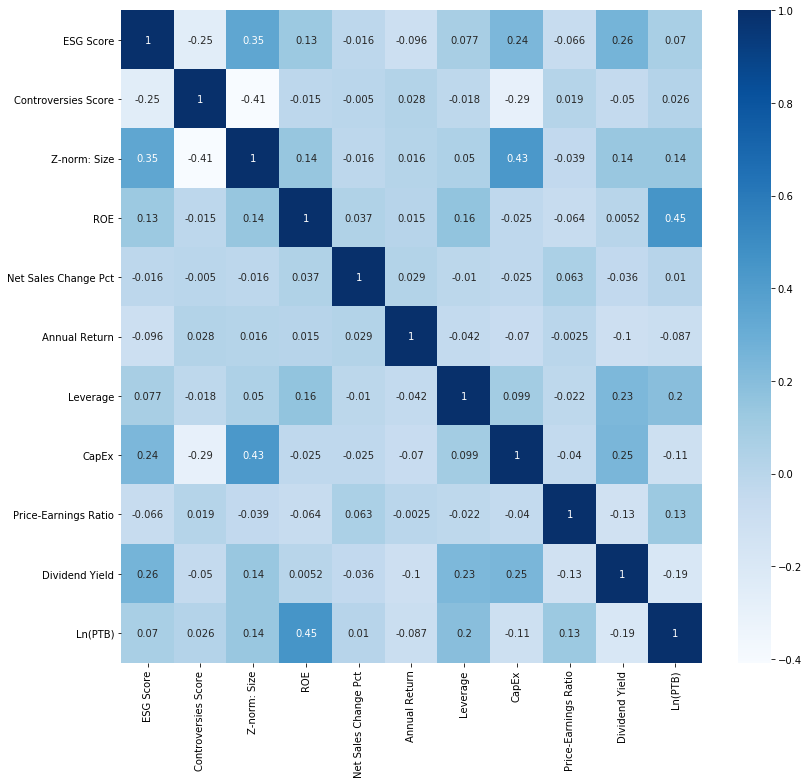

In [249]:
plt.figure(figsize=(13,12))
sns.heatmap(corr_mat, annot = True, cmap = 'Blues')
plt.show()

/Users/vanessatheel/.local/lib/python3.7/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


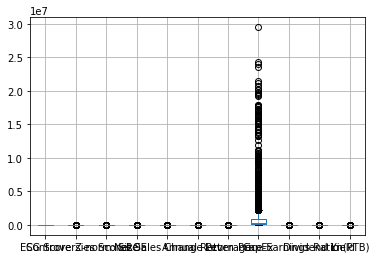

In [250]:
data[cont_vars].boxplot()

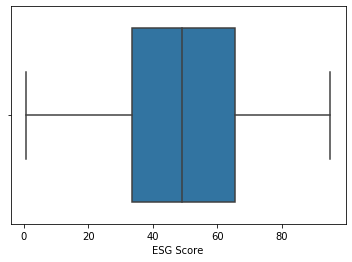

In [251]:
sns.boxplot(data[cont_vars[0]])

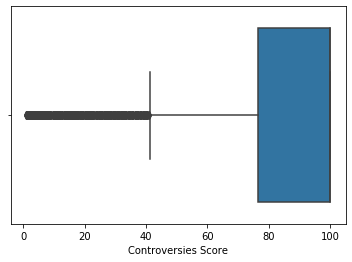

In [252]:
sns.boxplot(data[cont_vars[1]])

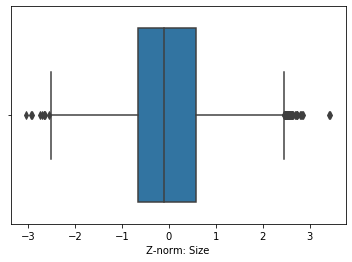

In [253]:
sns.boxplot(data[cont_vars[2]])

In [17]:
data['Ln(PTB)'] = np.log(data['Price-to-Book'])

/Users/vanessatheel/opt/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:856: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [19]:
cont_vars = ['ESG Score', 'Controversies Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage', 'Ln(PTB)']
vif(cont_vars, data)

                feature       VIF
0             ESG Score  5.436044
1   Controversies Score  5.621911
2          Z-norm: Size  1.393633
3                   ROE  2.454207
4  Net Sales Change Pct  1.005664
5         Annual Return  1.217908
6              Leverage  1.933723
7               Ln(PTB)  4.327275


In [284]:
cont_vars = ['ESG Score', 'Controversies Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage', 'CapEx', 'Price-Earnings Ratio', 'Dividend Yield', 'Ln(PTB)']

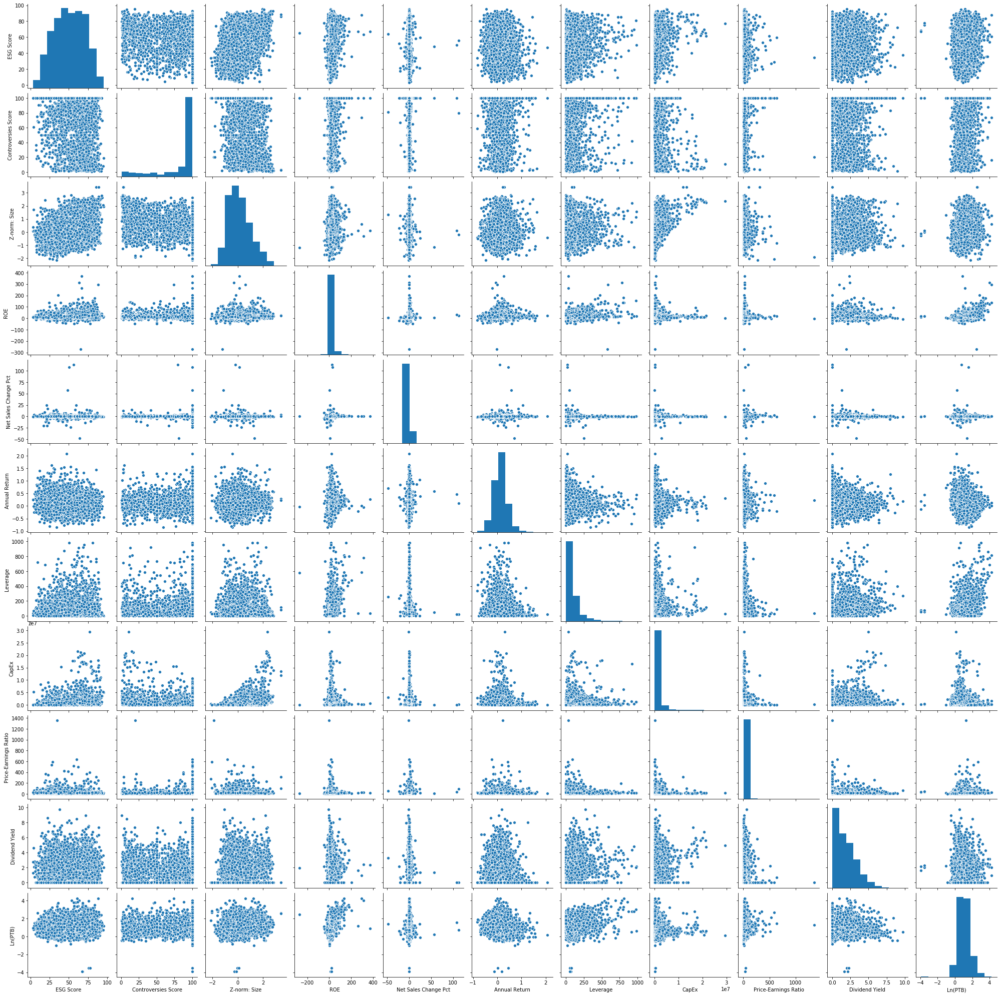

In [27]:
# Seaborn visualization library
import seaborn as sns
# Create the default pairplot
sns.pairplot(data[cont_vars].dropna())

In [28]:
grid = sns.PairGrid(data= data[cont_vars].dropna(),
                    vars = cont_vars, height = 11)
grid = grid.map_lower(plt.scatter)

/Users/vanessatheel/opt/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:1264: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(UserWarning(msg))


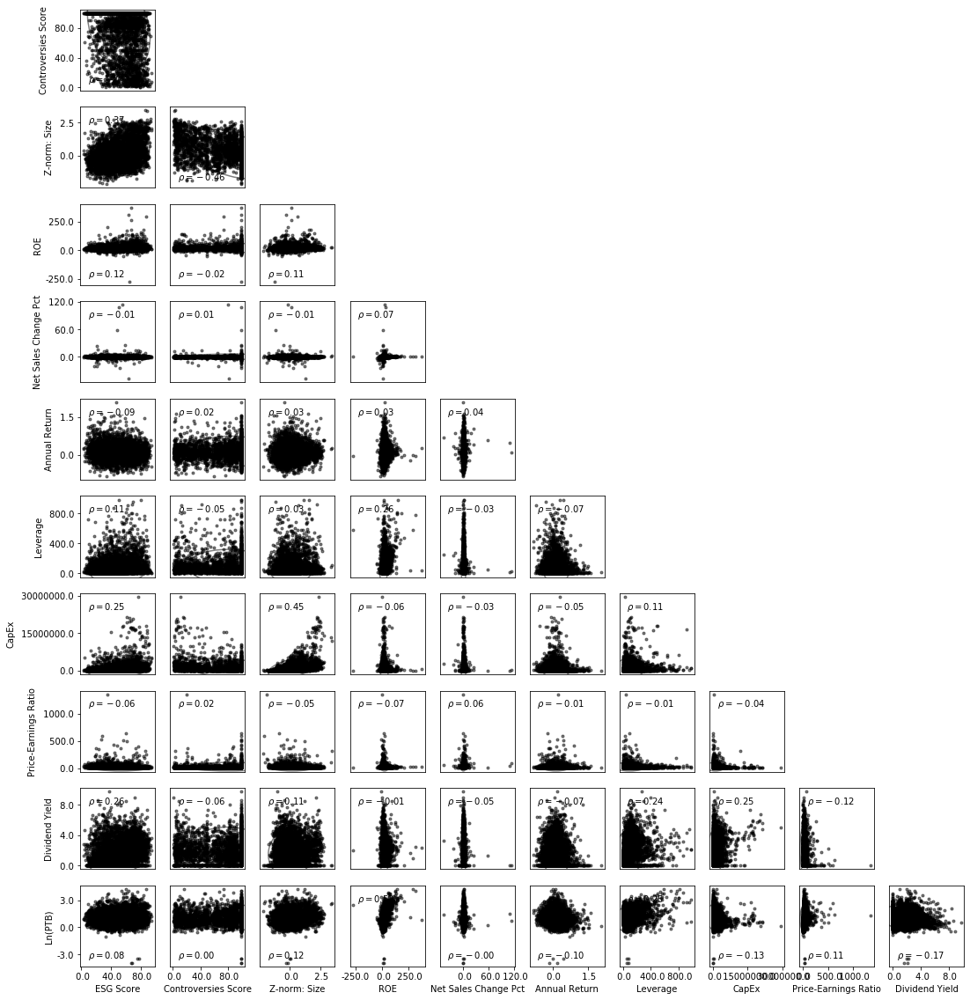

In [285]:
fig = plt.figure(figsize=(18,20))
scatter_ellipse(data[cont_vars].dropna(), varnames = cont_vars, fig=fig)
plt.show()

<Figure size 1008x1008 with 0 Axes>

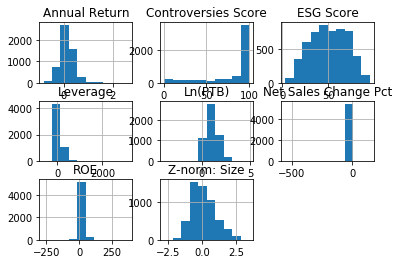

In [38]:
plt.figure(figsize=(14,14))
data[cont_vars].dropna().hist()
plt.show()

In [355]:
%matplotlib inline
%config InlineBackend.figure_format ='retina'
import seaborn as sns 
import matplotlib.pyplot as plt
import statsmodels.stats.api as sms
sns.set_style('darkgrid')
sns.mpl.rcParams['figure.figsize'] = (15.0, 9.0)

def linearity_test(model, y, titel):
    '''
    Function for visually inspecting the assumption of linearity in a linear regression model.
    It plots observed vs. predicted values and residuals vs. predicted values.
    
    Args:
    * model - fitted OLS model from statsmodels
    * y - observed values
    '''
    fitted_vals = model.predict()
    resids = model.resid

    fig, ax = plt.subplots(1,2)
    
    sns.regplot(x=fitted_vals, y=y, lowess=True, ax=ax[0], line_kws={'color': 'red'})
    ax[0].set_title('Observed vs. Predicted Values', fontsize=16)
    ax[0].set(xlabel='Predicted', ylabel='Observed')

    sns.regplot(x=fitted_vals, y=resids, lowess=True, ax=ax[1], line_kws={'color': 'red'})
    ax[1].set_title('Residuals vs. Predicted Values', fontsize=16)
    ax[1].set(xlabel='Predicted', ylabel='Residuals')
    fig.suptitle(titel, fontsize=16)

# 1.  Controversies Score - single and full

In [307]:
cont_vars0_c = ['Controversies Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage']#, 'CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [308]:
cont_vars_c = ['Controversies Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage']#, 'CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [309]:
cont_vars2_c = ['Controversies Score', 'Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage']#,'CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [310]:
cont_vars0_cf = ['Controversies Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage', 'CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [311]:
cont_vars_cf = ['Controversies Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage', 'CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [312]:
cont_vars2_cf = ['Controversies Score', 'Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage','CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [313]:
cont_vars_c.extend(ind)
cont_vars2_c.extend(sec)

In [314]:
cont_vars_cf.extend(ind)
cont_vars2_cf.extend(sec)

In [315]:
mod_cont, y_cont = mod(data, cont_vars2_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.505
Model:                            OLS   Adj. R-squared:                  0.499
Method:                 Least Squares   F-statistic:                     87.00
Date:                Tue, 16 Mar 2021   Prob (F-statistic):               0.00
Time:                        09:31:36   Log-Likelihood:                -3689.9
No. Observations:                5430   AIC:                             7508.
Df Residuals:                    5366   BIC:                             7930.
Df Model:                          63                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

In [316]:
mod_contf, y_contf = mod(data, cont_vars2_cf, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.545
Model:                            OLS   Adj. R-squared:                  0.539
Method:                 Least Squares   F-statistic:                     89.62
Date:                Tue, 16 Mar 2021   Prob (F-statistic):               0.00
Time:                        09:31:37   Log-Likelihood:                -3141.8
No. Observations:                5006   AIC:                             6418.
Df Residuals:                    4939   BIC:                             6854.
Df Model:                          66                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

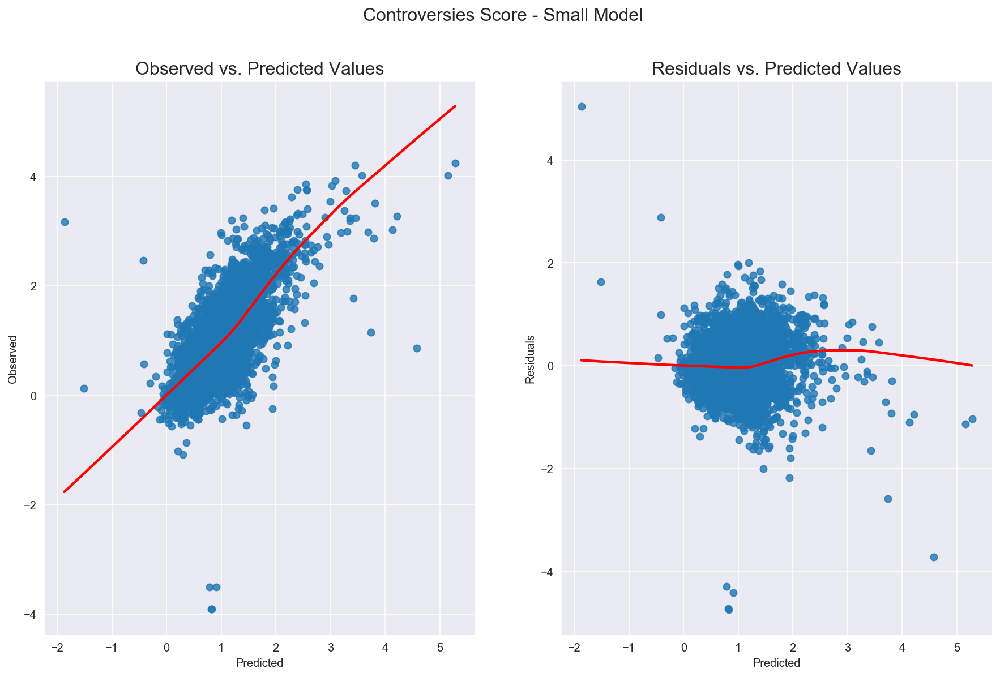

In [357]:
linearity_test(mod_cont.fit(), y_cont, 'Controversies Score - Small Model')  

In [348]:
mod_cont.fit().resid.mean()

-1.0112720973696149e-14

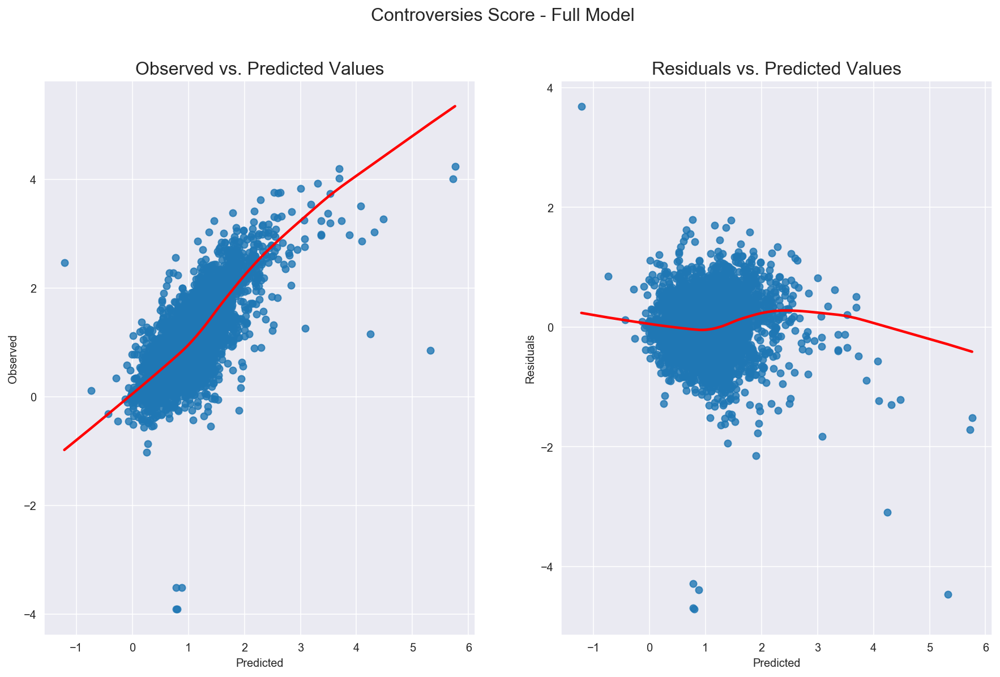

In [358]:
linearity_test(mod_contf.fit(), y_contf, 'Controversies Score - Full Model')  

In [347]:
mod_contf.fit().resid.mean()

-1.1883153978288357e-10

# 2. ESG Score - single and full

In [319]:
cont_vars0 = ['ESG Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage']#, 'CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [320]:
cont_vars = ['ESG Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage']#, 'CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [321]:
cont_vars2 = ['ESG Score', 'Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage']#,'CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [322]:
cont_vars0f = ['ESG Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage', 'CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [323]:
cont_varsf = ['ESG Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage', 'CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [324]:
cont_vars2f = ['ESG Score', 'Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage','CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [325]:
cont_vars.extend(ind)
cont_vars2.extend(sec)

In [326]:
cont_varsf.extend(ind)
cont_vars2f.extend(sec)

In [327]:
mod_esg, y_esg = mod(data, cont_vars2, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.506
Model:                            OLS   Adj. R-squared:                  0.501
Method:                 Least Squares   F-statistic:                     87.49
Date:                Tue, 16 Mar 2021   Prob (F-statistic):               0.00
Time:                        10:40:27   Log-Likelihood:                -3684.9
No. Observations:                5435   AIC:                             7498.
Df Residuals:                    5371   BIC:                             7920.
Df Model:                          63                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

In [328]:
mod_esgf, y_esgf = mod(data, cont_vars2f, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.545
Model:                            OLS   Adj. R-squared:                  0.539
Method:                 Least Squares   F-statistic:                     89.80
Date:                Tue, 16 Mar 2021   Prob (F-statistic):               0.00
Time:                        10:40:39   Log-Likelihood:                -3139.1
No. Observations:                5006   AIC:                             6412.
Df Residuals:                    4939   BIC:                             6849.
Df Model:                          66                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

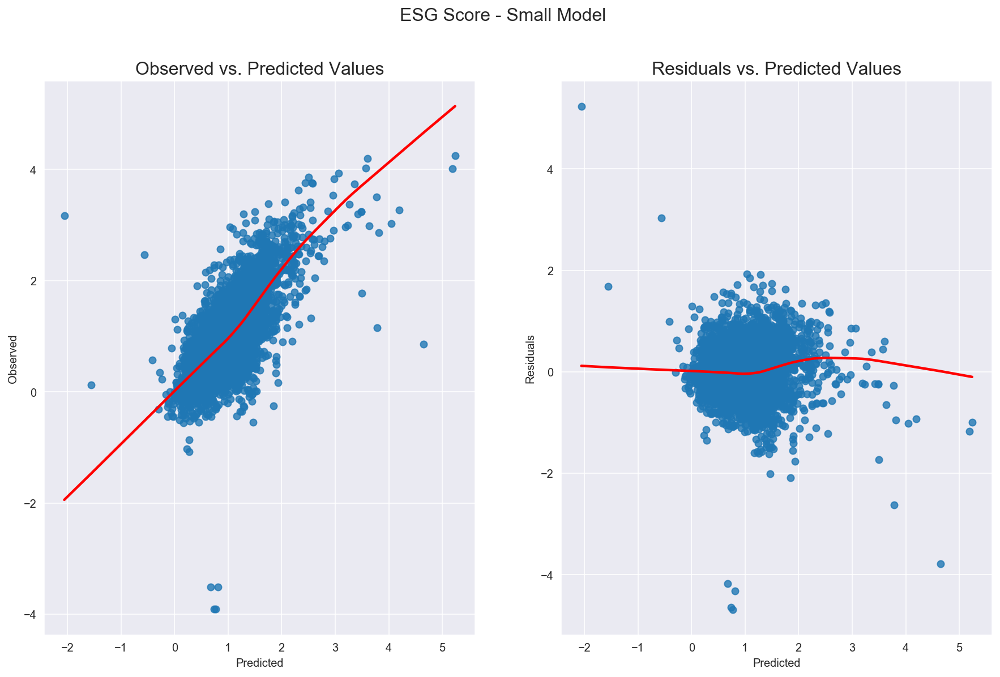

In [376]:
linearity_test(mod_esg.fit(covtype='HC1'), y_esg, 'ESG Score - Small Model')  

In [386]:
bp_test = pd.DataFrame(sms.het_breuschpagan(mod_esg.fit().get_robustcov_results(cov_type='HC1').resid, mod_esg.fit().get_robustcov_results(cov_type='HC1').model.exog), 
                           columns=['value'],
                           index=['Lagrange multiplier statistic', 'p-value', 'f-value', 'f p-value'])

In [388]:
mod_esgf.fit().get_robustcov_results(cov_type='HC1').summary()

/Users/vanessatheel/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 66, but rank is 65
  'rank is %d' % (J, J_), ValueWarning)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          Price-to-Book   R-squared:                       0.545
Model:                            OLS   Adj. R-squared:                  0.539
Method:                 Least Squares   F-statistic:                     91.19
Date:                Tue, 16 Mar 2021   Prob (F-statistic):               0.00
Time:                        12:49:11   Log-Likelihood:                -3139.1
No. Observations:                5006   AIC:                             6412.
Df Residuals:                    4939   BIC:                             6849.
Df Model:                          66                                         
Covariance Type:                  HC1                                         
=============================================================================================================
                                                coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------
const                                        -0.2643      0.098     -2.687      0.007      -0.457      -0.071
ESG Score                                    -0.0030      0.000     -6.554      0.000      -0.004      -0.002
Size                                          0.1094      0.010     11.330      0.000       0.090       0.128
ROE                                           0.0119      0.002      7.660      0.000       0.009       0.015
Net Sales Change Pct                         -0.0076      0.003     -2.421      0.016      -0.014      -0.001
Annual Return                                -0.2934      0.028    -10.339      0.000      -0.349      -0.238
Leverage                                      0.0014      0.000      8.842      0.000       0.001       0.002
CapEx                                     -4.656e-08   5.57e-09     -8.357      0.000   -5.75e-08   -3.56e-08
Price-Earnings Ratio                          0.0015      0.000      3.325      0.001       0.001       0.002
Dividend Yield                               -0.0213      0.006     -3.692      0.000      -0.033      -0.010
Automobiles and Parts                         0.0500      0.059      0.850      0.396      -0.065       0.165
Banks                                        -0.6187      0.050    -12.349      0.000      -0.717      -0.521
Beverages                                     0.5568      0.067      8.327      0.000       0.426       0.688
Chemicals                                     0.2864      0.047      6.105      0.000       0.194       0.378
Construction and Materials                   -0.2546      0.124     -2.048      0.041      -0.498      -0.011
Consumer Services                             0.4115      0.081      5.093      0.000       0.253       0.570
Electricity                                  -0.2806      0.044     -6.360      0.000      -0.367      -0.194
Electronic and Electrical Equipment           0.4330      0.051      8.574      0.000       0.334       0.532
Finance and Credit Services                   0.6418      0.209      3.070      0.002       0.232       1.052
Food Producers                                0.2805      0.056      4.993      0.000       0.170       0.391
Gas, Water and Multi-utilities               -0.3377      0.045     -7.438      0.000      -0.427      -0.249
General Industrials                           0.2076      0.045      4.607      0.000       0.119       0.296
Health Care Providers                        -0.1518      0.053     -2.862      0.004      -0.256      -0.048
Household Goods and Home Construction        -0.1581      0.058     -2.731      0.006      -0.272      -0.045
Industrial Engineering                       -0.0235      0.049     -0.482      0.630      -0.119       0.072
Ind

In [389]:
mod_esgf.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          Price-to-Book   R-squared:                       0.545
Model:                            OLS   Adj. R-squared:                  0.539
Method:                 Least Squares   F-statistic:                     89.80
Date:                Tue, 16 Mar 2021   Prob (F-statistic):               0.00
Time:                        12:49:30   Log-Likelihood:                -3139.1
No. Observations:                5006   AIC:                             6412.
Df Residuals:                    4939   BIC:                             6849.
Df Model:                          66                                         
Covariance Type:            nonrobust                                         
=============================================================================================================
                                                coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------
const                                        -0.2643      0.094     -2.807      0.005      -0.449      -0.080
ESG Score                                    -0.0030      0.000     -6.477      0.000      -0.004      -0.002
Size                                          0.1094      0.009     11.860      0.000       0.091       0.127
ROE                                           0.0119      0.000     31.542      0.000       0.011       0.013
Net Sales Change Pct                         -0.0076      0.002     -3.275      0.001      -0.012      -0.003
Annual Return                                -0.2934      0.028    -10.328      0.000      -0.349      -0.238
Leverage                                      0.0014   7.04e-05     19.287      0.000       0.001       0.001
CapEx                                     -4.656e-08   4.98e-09     -9.354      0.000   -5.63e-08   -3.68e-08
Price-Earnings Ratio                          0.0015      0.000      7.974      0.000       0.001       0.002
Dividend Yield                               -0.0213      0.006     -3.567      0.000      -0.033      -0.010
Automobiles and Parts                         0.0500      0.071      0.706      0.480      -0.089       0.189
Banks                                        -0.6187      0.057    -10.937      0.000      -0.730      -0.508
Beverages                                     0.5568      0.064      8.671      0.000       0.431       0.683
Chemicals                                     0.2864      0.054      5.276      0.000       0.180       0.393
Construction and Materials                   -0.2546      0.062     -4.125      0.000      -0.376      -0.134
Consumer Services                             0.4115      0.099      4.169      0.000       0.218       0.605
Electricity                                  -0.2806      0.047     -5.922      0.000      -0.374      -0.188
Electronic and Electrical Equipment           0.4330      0.052      8.333      0.000       0.331       0.535
Finance and Credit Services                   0.6418      0.150      4.273      0.000       0.347       0.936
Food Producers                                0.2805      0.052      5.442      0.000       0.179       0.382
Gas, Water and Multi-utilities               -0.3377      0.060     -5.619      0.000      -0.456      -0.220
General Industrials                           0.2076      0.050      4.191      0.000       0.110       0.305
Health Care Providers                        -0.1518      0.057     -2.665      0.008      -0.263      -0.040
Household Goods and Home Construction        -0.1581      0.060     -2.637      0.008      -0.276      -0.041
Industrial Engineering                       -0.0235      0.066     -0.355      0.723      -0.153       0.106
Ind

In [387]:
bp_test

,value
Lagrange multiplier statistic,2.740042e+02
p-value,4.088462e-28
f-value,4.526248e+00
f p-value,4.942665e-29


In [346]:
mod_esg.fit().resid.mean()

-2.1305659883790953e-17

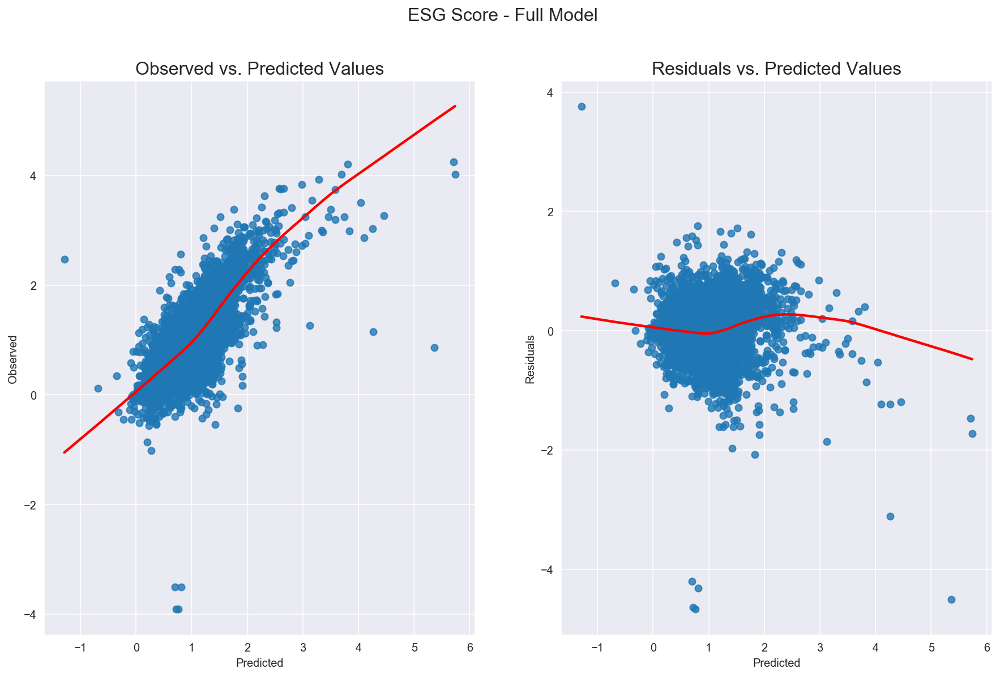

In [360]:
linearity_test(mod_esgf.fit(), y_esgf, 'ESG Score - Full Model')

In [345]:
mod_esgf.fit().resid.mean()

-1.1016376114262139e-10

# 3. Both - single and full

In [331]:
cont_varsb0 = ['ESG Score','Controversies Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage']#, 'CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [332]:
cont_varsb = ['ESG Score', 'Controversies Score','Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage']#, 'CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [333]:
cont_varsb2 = ['ESG Score','Controversies Score', 'Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage']#,'CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [334]:
cont_varsb0f = ['ESG Score','Controversies Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage', 'CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [335]:
cont_varsbf = ['ESG Score','Controversies Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage', 'CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [336]:
cont_varsb2f = ['ESG Score', 'Controversies Score','Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage','CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [337]:
cont_varsb.extend(ind)
cont_varsb2.extend(sec)

In [338]:
cont_varsbf.extend(ind)
cont_varsb2f.extend(sec)

In [339]:
mod_b, y_b = mod(data, cont_varsb2, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.512
Model:                            OLS   Adj. R-squared:                  0.506
Method:                 Least Squares   F-statistic:                     87.81
Date:                Tue, 16 Mar 2021   Prob (F-statistic):               0.00
Time:                        10:43:16   Log-Likelihood:                -3655.1
No. Observations:                5430   AIC:                             7440.
Df Residuals:                    5365   BIC:                             7869.
Df Model:                          64                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

In [340]:
mod_bf, y_bf = mod(data, cont_varsb2f, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.548
Model:                            OLS   Adj. R-squared:                  0.542
Method:                 Least Squares   F-statistic:                     89.40
Date:                Tue, 16 Mar 2021   Prob (F-statistic):               0.00
Time:                        10:43:28   Log-Likelihood:                -3124.3
No. Observations:                5006   AIC:                             6385.
Df Residuals:                    4938   BIC:                             6828.
Df Model:                          67                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

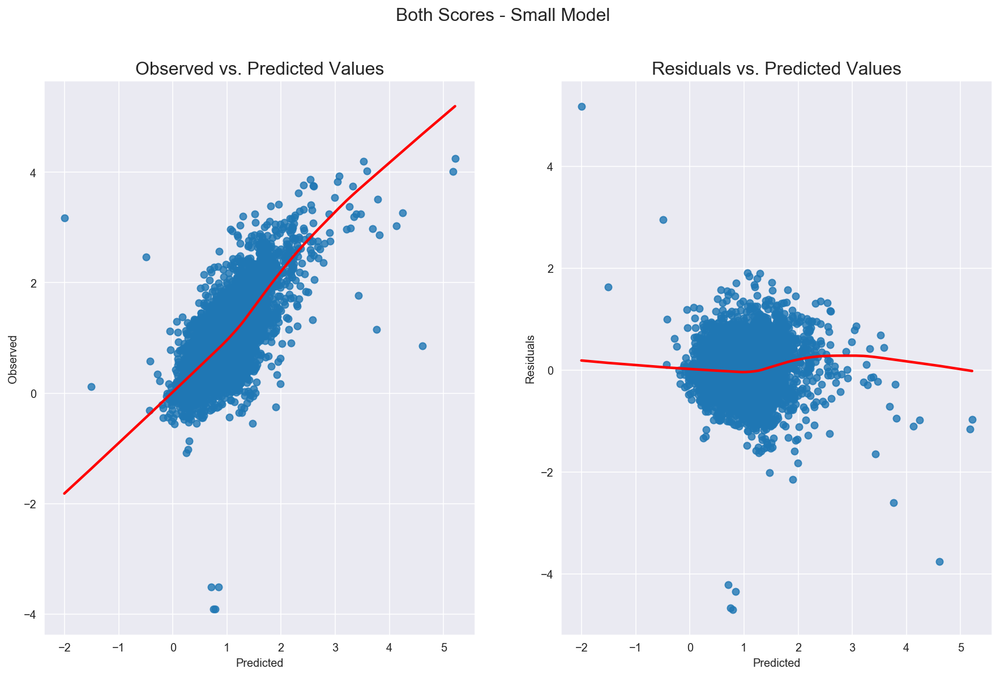

In [361]:
linearity_test(mod_b.fit(), y_b, 'Both Scores - Small Model')  

In [366]:
bp_test = pd.DataFrame(sms.het_breuschpagan(mod_b.fit().resid, mod_b.fit().model.exog), 
                           columns=['value'],
                           index=['Lagrange multiplier statistic', 'p-value', 'f-value', 'f p-value'])

In [367]:
bp_test

,value
Lagrange multiplier statistic,2.722655e+02
p-value,1.687146e-27
f-value,4.425103e+00
f p-value,2.150436e-28


In [343]:
mod_b.fit().resid.mean()

-1.4195704157904633e-14

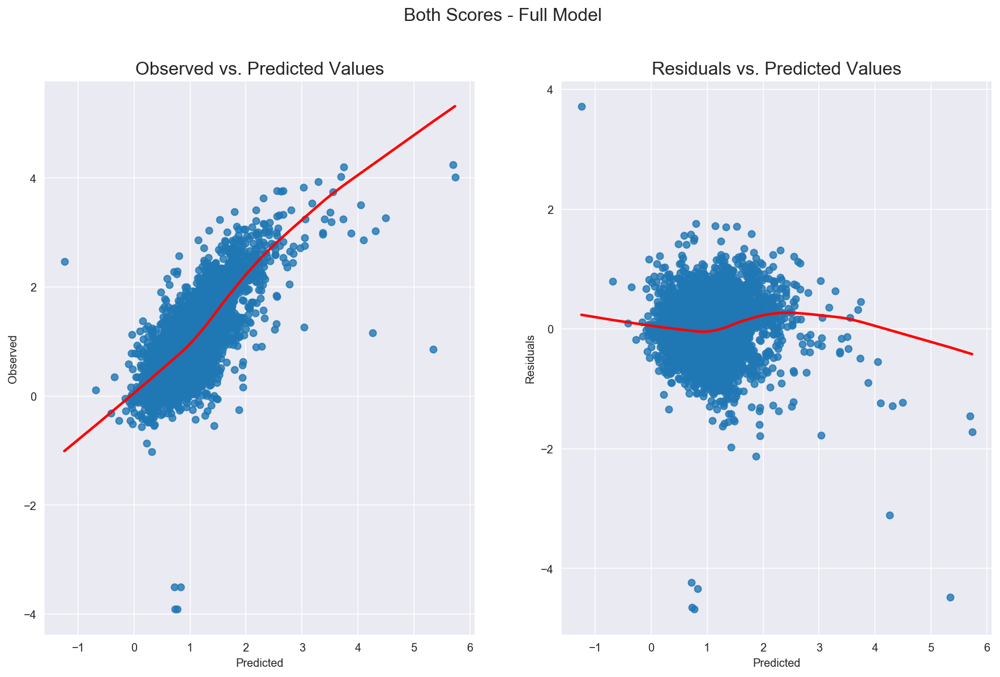

In [362]:
linearity_test(mod_bf.fit(), y_bf, 'Both Scores - Full Model')

In [344]:
mod_bf.fit().resid.mean()

1.6899604934254787e-10

In [363]:
mod_bf.fit().model.exog

array([[  1.  ,  29.74,  30.  , ...,   0.  ,   0.  ,   0.  ],
       [  1.  ,  20.93, 100.  , ...,   0.  ,   0.  ,   0.  ],
       [  1.  ,  27.53,   4.55, ...,   0.  ,   0.  ,   0.  ],
       ...,
       [  1.  ,  85.04,  89.58, ...,   1.  ,   0.  ,   0.  ],
       [  1.  ,  84.58, 100.  , ...,   0.  ,   1.  ,   0.  ],
       [  1.  ,  23.26,  67.27, ...,   0.  ,   1.  ,   0.  ]])

In [ ]:
import statsmodels.stats.api as sms

In [364]:
bp_test = pd.DataFrame(sms.het_breuschpagan(mod_bf.fit().resid, mod_bf.fit().model.exog), 
                           columns=['value'],
                           index=['Lagrange multiplier statistic', 'p-value', 'f-value', 'f p-value'])

In [365]:
bp_test

,value
Lagrange multiplier statistic,3.418025e+02
p-value,1.802362e-38
f-value,5.401006e+00
f p-value,3.478386e-40


In [43]:
#data2 = data.set_index(['ICB INDUSTRY NAME', 'Timepoint'])
#x = sm.add_constant(data2[cont_vars])
#mod = PanelOLS(data2['Price-to-Book'], x, entity_effects=True)
#fe_te_res = mod.fit()
#print(fe_te_res)

In [7]:
cont_vars = ['ESG Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage']
vif(cont_vars, data)

                feature       VIF
0             ESG Score  2.003778
1          Z-norm: Size  1.071538
2                   ROE  1.751373
3  Net Sales Change Pct  1.000605
4         Annual Return  1.155498
5              Leverage  1.211801


In [9]:
mod(data, cont_vars, 'Price-to-Book')

/Users/vanessatheel/opt/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:856: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/vanessatheel/opt/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2580: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.247
Model:                            OLS   Adj. R-squared:                  0.247
Method:                 Least Squares   F-statistic:                     305.4
Date:                Mon, 08 Feb 2021   Prob (F-statistic):               0.00
Time:                        08:27:25   Log-Likelihood:                -5025.9
No. Observations:                5584   AIC:                         1.007e+04
Df Residuals:                    5577   BIC:                         1.011e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.7784 

In [15]:
cont_vars = ['Controversies Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage']
vif(cont_vars, data)

                feature       VIF
0   Controversies Score  1.930431
1          Z-norm: Size  1.085993
2                   ROE  1.754891
3  Net Sales Change Pct  1.000402
4         Annual Return  1.206292
5              Leverage  1.207430


In [11]:
mod(data, cont_vars, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.253
Model:                            OLS   Adj. R-squared:                  0.252
Method:                 Least Squares   F-statistic:                     313.8
Date:                Mon, 08 Feb 2021   Prob (F-statistic):               0.00
Time:                        08:27:42   Log-Likelihood:                -5003.8
No. Observations:                5579   AIC:                         1.002e+04
Df Residuals:                    5572   BIC:                         1.007e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.5808 

# I. All years

In [36]:
pd.set_option('display.max_rows', 100)

In [37]:
onehot1 = pd.get_dummies(data['ICB INDUSTRY NAME'])
onehot2 = pd.get_dummies(data['ICB SECTOR NAME'])
onehot3 = pd.get_dummies(data['Time'])
data = pd.concat([data, onehot1, onehot2, onehot3], axis = 1)

In [38]:
onehot1.columns

Index(['Basic Materials', 'Consumer Discretionary', 'Consumer Staples',
       'Energy', 'Financials', 'Health Care', 'Industrials', 'Real Estate',
       'Technology', 'Telecommunications', 'Utilities'],
      dtype='object')

In [261]:
ind = list(onehot1.columns.values[1:])
ind.extend(list(onehot3.columns.values[2:-1]))

In [262]:
sec = list(onehot2.columns.values[1:])
sec.extend(list(onehot3.columns.values[2:-1]))

### Controversies Score

In [95]:
cont_vars0_c = ['ESG Score', 'Controversies Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage']#, 'CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [96]:
cont_vars_c = ['ESG Score', 'Controversies Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage']#, 'CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [277]:
cont_vars2_c = ['ESG Score','Controversies Score', 'Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage','CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [278]:
cont_vars_c.extend(ind)
cont_vars2_c.extend(sec)

In [69]:
vif(cont_vars_c, data)

                   feature       VIF
0      Controversies Score  9.346472
1             Z-norm: Size  1.346975
2                      ROE  2.095227
3     Net Sales Change Pct  1.010947
4            Annual Return  1.776036
5                 Leverage  1.874355
6   Consumer Discretionary  2.893150
7         Consumer Staples  2.031836
8                   Energy  1.534371
9               Financials  2.505601
10             Health Care  2.508906
11             Industrials  3.371420
12             Real Estate  1.784178
13              Technology  2.435234
14      Telecommunications  1.297077
15               Utilities  2.037138
16                    2004  1.659929
17                    2005  1.766713
18                    2006  1.757079
19                    2007  1.779470
20                    2008  2.135451
21                    2009  1.900135
22                    2010  1.814070
23                    2011  1.924215
24                    2012  1.888198
25                    2013  1.900413
2

In [279]:
test = vif(cont_vars2_c, data)

                                      feature        VIF
0                                   ESG Score  15.019223
1                         Controversies Score  10.308856
2                                        Size  65.087298
3                                         ROE   2.520196
4                        Net Sales Change Pct   1.031738
5                               Annual Return   1.910511
6                                    Leverage   2.030282
7                                       CapEx   2.511666
8                        Price-Earnings Ratio   1.709712
9                              Dividend Yield   4.717101
10                      Automobiles and Parts   1.312037
11                                      Banks   1.646828
12                                  Beverages   1.423319
13                                  Chemicals   1.719782
14                 Construction and Materials   1.414876
15                          Consumer Services   1.148851
16                             

In [83]:
mod(data, cont_vars0_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.382
Model:                            OLS   Adj. R-squared:                  0.381
Method:                 Least Squares   F-statistic:                     343.1
Date:                Mon, 15 Mar 2021   Prob (F-statistic):               0.00
Time:                        14:14:02   Log-Likelihood:                -3908.1
No. Observations:                5006   AIC:                             7836.
Df Residuals:                    4996   BIC:                             7901.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.7115 

In [56]:
mod(data, cont_vars_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.441
Model:                            OLS   Adj. R-squared:                  0.438
Method:                 Least Squares   F-statistic:                     125.4
Date:                Mon, 15 Mar 2021   Prob (F-statistic):               0.00
Time:                        13:59:09   Log-Likelihood:                -4020.0
No. Observations:                5430   AIC:                             8110.
Df Residuals:                    5395   BIC:                             8341.
Df Model:                          34                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [103]:
mod_cont = mod(data, cont_vars2_c, 'Price-to-Book').fit()

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.547
Model:                            OLS   Adj. R-squared:                  0.541
Method:                 Least Squares   F-statistic:                     89.01
Date:                Mon, 15 Mar 2021   Prob (F-statistic):               0.00
Time:                        14:23:24   Log-Likelihood:                -3130.3
No. Observations:                5006   AIC:                             6397.
Df Residuals:                    4938   BIC:                             6840.
Df Model:                          67                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

In [104]:
print(mod_cont.summary().as_latex())

\begin{center}
\begin{tabular}{lclc}
\toprule
\textbf{Dep. Variable:}                            &  Price-to-Book   & \textbf{  R-squared:         } &     0.547   \\
\textbf{Model:}                                    &       OLS        & \textbf{  Adj. R-squared:    } &     0.541   \\
\textbf{Method:}                                   &  Least Squares   & \textbf{  F-statistic:       } &     89.01   \\
\textbf{Date:}                                     & Mon, 15 Mar 2021 & \textbf{  Prob (F-statistic):} &     0.00    \\
\textbf{Time:}                                     &     14:23:28     & \textbf{  Log-Likelihood:    } &   -3130.3   \\
\textbf{No. Observations:}                         &        5006      & \textbf{  AIC:               } &     6397.   \\
\textbf{Df Residuals:}                             &        4938      & \textbf{  BIC:               } &     6840.   \\
\textbf{Df Model:}                                 &          67      & \textbf{                     } &          

### ESG Score

In [73]:
cont_vars0 = ['ESG Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage','CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [74]:
cont_vars = ['ESG Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage','CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [75]:
cont_vars2 = ['ESG Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage','CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [76]:
cont_vars.extend(ind)
cont_vars2.extend(sec)

In [62]:
vif(cont_vars, data)

                   feature        VIF
0                ESG Score  11.401675
1             Z-norm: Size   1.444714
2                      ROE   2.084291
3     Net Sales Change Pct   1.010990
4            Annual Return   1.735756
5                 Leverage   1.880205
6   Consumer Discretionary   2.807598
7         Consumer Staples   2.011089
8                   Energy   1.474003
9               Financials   2.356141
10             Health Care   2.410531
11             Industrials   3.166761
12             Real Estate   1.698250
13              Technology   2.337510
14      Telecommunications   1.290154
15               Utilities   1.970399
16                    2004   1.593713
17                    2005   1.697478
18                    2006   1.742651
19                    2007   1.833009
20                    2008   2.169164
21                    2009   2.154630
22                    2010   2.109136
23                    2011   2.177363
24                    2012   2.176605
25          

In [107]:
vif(cont_vars2, data)

                 feature        VIF
0              ESG Score  13.005120
1           Z-norm: Size   1.674978
2                    ROE   2.020257
3   Net Sales Change Pct   1.010617
4          Annual Return   1.768824
..                   ...        ...
58                  2016   2.611429
59                  2017   2.663960
60                  2018   2.800165
61                  2019   2.444593
62                  2020   1.086746

[63 rows x 2 columns]


In [129]:
mod(data, cont_vars0, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.251
Model:                            OLS   Adj. R-squared:                  0.250
Method:                 Least Squares   F-statistic:                     314.3
Date:                Tue, 26 Jan 2021   Prob (F-statistic):               0.00
Time:                        12:28:33   Log-Likelihood:                -5116.7
No. Observations:                5644   AIC:                         1.025e+04
Df Residuals:                    5637   BIC:                         1.029e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.7912 

In [130]:
mod(data, cont_vars, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.441
Model:                            OLS   Adj. R-squared:                  0.438
Method:                 Least Squares   F-statistic:                     130.2
Date:                Tue, 26 Jan 2021   Prob (F-statistic):               0.00
Time:                        12:28:43   Log-Likelihood:                -4289.3
No. Observations:                5644   AIC:                             8649.
Df Residuals:                    5609   BIC:                             8881.
Df Model:                          34                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [77]:
mod_esg = mod(data, cont_vars2, 'Price-to-Book').fit()

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.544
Model:                            OLS   Adj. R-squared:                  0.538
Method:                 Least Squares   F-statistic:                     89.43
Date:                Mon, 15 Mar 2021   Prob (F-statistic):               0.00
Time:                        14:09:39   Log-Likelihood:                -3144.8
No. Observations:                5006   AIC:                             6424.
Df Residuals:                    4939   BIC:                             6860.
Df Model:                          66                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

In [78]:
print(mod_esg.summary().as_latex())

\begin{center}
\begin{tabular}{lclc}
\toprule
\textbf{Dep. Variable:}                            &  Price-to-Book   & \textbf{  R-squared:         } &     0.544   \\
\textbf{Model:}                                    &       OLS        & \textbf{  Adj. R-squared:    } &     0.538   \\
\textbf{Method:}                                   &  Least Squares   & \textbf{  F-statistic:       } &     89.43   \\
\textbf{Date:}                                     & Mon, 15 Mar 2021 & \textbf{  Prob (F-statistic):} &     0.00    \\
\textbf{Time:}                                     &     14:12:24     & \textbf{  Log-Likelihood:    } &   -3144.8   \\
\textbf{No. Observations:}                         &        5006      & \textbf{  AIC:               } &     6424.   \\
\textbf{Df Residuals:}                             &        4939      & \textbf{  BIC:               } &     6860.   \\
\textbf{Df Model:}                                 &          66      & \textbf{                     } &          

# Time-Varying

### no more yearly fixed effects

In [105]:
ind = list(onehot1.columns.values[1:])
sec = list(onehot2.columns.values[1:])

In [106]:
cont_vars0_c = ['Controversies Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage']

In [107]:
cont_vars_c = ['Controversies Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage']

In [108]:
cont_vars2_c = ['Controversies Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage']

In [109]:
cont_vars_c.extend(ind)
cont_vars2_c.extend(sec)

In [110]:
cont_vars0 = ['ESG Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage']

In [111]:
cont_vars = ['ESG Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage']

In [112]:
cont_vars2 = ['ESG Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage']

In [232]:
cont_vars2 = ['ESG Score', 'Controversies Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage','CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [233]:
cont_vars.extend(ind)
cont_vars2.extend(sec)

## 2003

### ESG Score

In [114]:
mod_03 = mod(data[data['Time'] == 2003], cont_vars0, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.371
Model:                            OLS   Adj. R-squared:                  0.350
Method:                 Least Squares   F-statistic:                     17.58
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           5.84e-16
Time:                        14:32:38   Log-Likelihood:                -127.08
No. Observations:                 186   AIC:                             268.2
Df Residuals:                     179   BIC:                             290.7
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.7917 

In [115]:
mod_03_ind = mod(data[data['Time'] == 2003], cont_vars, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.533
Model:                            OLS   Adj. R-squared:                  0.488
Method:                 Least Squares   F-statistic:                     12.04
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.35e-20
Time:                        14:32:38   Log-Likelihood:                -99.427
No. Observations:                 186   AIC:                             232.9
Df Residuals:                     169   BIC:                             287.7
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      1

In [116]:
mod_03_sec = mod(data[data['Time'] == 2003], cont_vars2, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.613
Model:                            OLS   Adj. R-squared:                  0.506
Method:                 Least Squares   F-statistic:                     5.746
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.78e-15
Time:                        14:32:39   Log-Likelihood:                -81.831
No. Observations:                 186   AIC:                             245.7
Df Residuals:                     145   BIC:                             377.9
Df Model:                          40                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

/Users/vanessatheel/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:1362: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse


### Controversies Score

In [117]:
mod_03_c = mod(data[data['Time'] == 2003], cont_vars0_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.371
Model:                            OLS   Adj. R-squared:                  0.349
Method:                 Least Squares   F-statistic:                     17.47
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           7.45e-16
Time:                        14:32:40   Log-Likelihood:                -126.70
No. Observations:                 185   AIC:                             267.4
Df Residuals:                     178   BIC:                             289.9
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.7187 

In [118]:
mod_03_ind_c = mod(data[data['Time'] == 2003], cont_vars_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.532
Model:                            OLS   Adj. R-squared:                  0.488
Method:                 Least Squares   F-statistic:                     11.95
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.00e-20
Time:                        14:32:40   Log-Likelihood:                -99.224
No. Observations:                 185   AIC:                             232.4
Df Residuals:                     168   BIC:                             287.2
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [119]:
mod_03_sec_c = mod(data[data['Time'] == 2003], cont_vars2_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.616
Model:                            OLS   Adj. R-squared:                  0.509
Method:                 Least Squares   F-statistic:                     5.776
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.54e-15
Time:                        14:32:41   Log-Likelihood:                -80.973
No. Observations:                 185   AIC:                             243.9
Df Residuals:                     144   BIC:                             376.0
Df Model:                          40                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

## 2004

### ESG Score

In [120]:
mod_04 = mod(data[data['Time'] == 2004], cont_vars0, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.322
Model:                            OLS   Adj. R-squared:                  0.305
Method:                 Least Squares   F-statistic:                     18.87
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           6.06e-18
Time:                        14:32:41   Log-Likelihood:                -155.82
No. Observations:                 245   AIC:                             325.6
Df Residuals:                     238   BIC:                             350.1
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.8686 

In [121]:
mod_04_ind = mod(data[data['Time'] == 2004], cont_vars, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.498
Model:                            OLS   Adj. R-squared:                  0.463
Method:                 Least Squares   F-statistic:                     14.16
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           3.52e-26
Time:                        14:32:41   Log-Likelihood:                -118.96
No. Observations:                 245   AIC:                             271.9
Df Residuals:                     228   BIC:                             331.4
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [122]:
mod_04_sec = mod(data[data['Time'] == 2004], cont_vars2, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.564
Model:                            OLS   Adj. R-squared:                  0.474
Method:                 Least Squares   F-statistic:                     6.233
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.56e-19
Time:                        14:32:42   Log-Likelihood:                -101.67
No. Observations:                 245   AIC:                             289.3
Df Residuals:                     202   BIC:                             439.9
Df Model:                          42                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

### Controversies Score

In [123]:
mod_04_c = mod(data[data['Time'] == 2004], cont_vars0_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.321
Model:                            OLS   Adj. R-squared:                  0.304
Method:                 Least Squares   F-statistic:                     18.70
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           8.72e-18
Time:                        14:32:42   Log-Likelihood:                -155.28
No. Observations:                 244   AIC:                             324.6
Df Residuals:                     237   BIC:                             349.0
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.9311 

In [124]:
mod_04_ind_c = mod(data[data['Time'] == 2004], cont_vars_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.496
Model:                            OLS   Adj. R-squared:                  0.461
Method:                 Least Squares   F-statistic:                     13.97
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           7.97e-26
Time:                        14:32:42   Log-Likelihood:                -118.95
No. Observations:                 244   AIC:                             271.9
Df Residuals:                     227   BIC:                             331.3
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [125]:
mod_04_sec_c = mod(data[data['Time'] == 2004], cont_vars2_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.561
Model:                            OLS   Adj. R-squared:                  0.469
Method:                 Least Squares   F-statistic:                     6.116
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           4.24e-19
Time:                        14:32:42   Log-Likelihood:                -102.12
No. Observations:                 244   AIC:                             290.2
Df Residuals:                     201   BIC:                             440.6
Df Model:                          42                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

## 2005

### ESG Score

In [126]:
mod_05 = mod(data[data['Time'] == 2005], cont_vars0, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.305
Model:                            OLS   Adj. R-squared:                  0.289
Method:                 Least Squares   F-statistic:                     19.65
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           5.24e-19
Time:                        14:32:43   Log-Likelihood:                -175.51
No. Observations:                 276   AIC:                             365.0
Df Residuals:                     269   BIC:                             390.4
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.7772 

In [127]:
mod_05_ind = mod(data[data['Time'] == 2005], cont_vars, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.456
Model:                            OLS   Adj. R-squared:                  0.423
Method:                 Least Squares   F-statistic:                     13.58
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           3.64e-26
Time:                        14:32:43   Log-Likelihood:                -141.60
No. Observations:                 276   AIC:                             317.2
Df Residuals:                     259   BIC:                             378.8
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [128]:
mod_05_sec = mod(data[data['Time'] == 2005], cont_vars2, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.545
Model:                            OLS   Adj. R-squared:                  0.456
Method:                 Least Squares   F-statistic:                     6.132
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           6.71e-21
Time:                        14:32:43   Log-Likelihood:                -116.87
No. Observations:                 276   AIC:                             325.7
Df Residuals:                     230   BIC:                             492.3
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

### Controversies Score

In [129]:
mod_05_c = mod(data[data['Time'] == 2005], cont_vars0_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.304
Model:                            OLS   Adj. R-squared:                  0.289
Method:                 Least Squares   F-statistic:                     19.52
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           7.01e-19
Time:                        14:32:44   Log-Likelihood:                -175.48
No. Observations:                 275   AIC:                             365.0
Df Residuals:                     268   BIC:                             390.3
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.8264 

In [130]:
mod_05_ind_c = mod(data[data['Time'] == 2005], cont_vars_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.457
Model:                            OLS   Adj. R-squared:                  0.424
Method:                 Least Squares   F-statistic:                     13.59
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           3.68e-26
Time:                        14:32:44   Log-Likelihood:                -141.27
No. Observations:                 275   AIC:                             316.5
Df Residuals:                     258   BIC:                             378.0
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [131]:
mod_05_sec_c = mod(data[data['Time'] == 2005], cont_vars2_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.547
Model:                            OLS   Adj. R-squared:                  0.458
Method:                 Least Squares   F-statistic:                     6.135
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           7.06e-21
Time:                        14:32:44   Log-Likelihood:                -116.56
No. Observations:                 275   AIC:                             325.1
Df Residuals:                     229   BIC:                             491.5
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

## 2006

### ESG Score

In [132]:
mod_06 = mod(data[data['Time'] == 2006], cont_vars0, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.265
Model:                            OLS   Adj. R-squared:                  0.249
Method:                 Least Squares   F-statistic:                     16.62
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.34e-16
Time:                        14:32:45   Log-Likelihood:                -177.79
No. Observations:                 283   AIC:                             369.6
Df Residuals:                     276   BIC:                             395.1
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.6265 

In [133]:
mod_06_ind = mod(data[data['Time'] == 2006], cont_vars, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.438
Model:                            OLS   Adj. R-squared:                  0.405
Method:                 Least Squares   F-statistic:                     12.98
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.77e-25
Time:                        14:32:45   Log-Likelihood:                -139.77
No. Observations:                 283   AIC:                             313.5
Df Residuals:                     266   BIC:                             375.5
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [134]:
mod_06_sec = mod(data[data['Time'] == 2006], cont_vars2, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.534
Model:                            OLS   Adj. R-squared:                  0.444
Method:                 Least Squares   F-statistic:                     5.890
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.07e-20
Time:                        14:32:45   Log-Likelihood:                -113.25
No. Observations:                 283   AIC:                             320.5
Df Residuals:                     236   BIC:                             491.8
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

### Controversies Score

In [135]:
mod_06_c = mod(data[data['Time'] == 2006], cont_vars0_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.264
Model:                            OLS   Adj. R-squared:                  0.248
Method:                 Least Squares   F-statistic:                     16.41
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           3.70e-16
Time:                        14:32:45   Log-Likelihood:                -177.91
No. Observations:                 282   AIC:                             369.8
Df Residuals:                     275   BIC:                             395.3
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.6380 

In [136]:
mod_06_ind_c = mod(data[data['Time'] == 2006], cont_vars_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.438
Model:                            OLS   Adj. R-squared:                  0.404
Method:                 Least Squares   F-statistic:                     12.92
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           3.81e-25
Time:                        14:32:46   Log-Likelihood:                -139.76
No. Observations:                 282   AIC:                             313.5
Df Residuals:                     265   BIC:                             375.4
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [137]:
mod_06_sec_c = mod(data[data['Time'] == 2006], cont_vars2_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.536
Model:                            OLS   Adj. R-squared:                  0.446
Method:                 Least Squares   F-statistic:                     5.913
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.81e-20
Time:                        14:32:46   Log-Likelihood:                -112.65
No. Observations:                 282   AIC:                             319.3
Df Residuals:                     235   BIC:                             490.5
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

## 2007

### ESG Score

In [138]:
mod_07 = mod(data[data['Time'] == 2007], cont_vars0, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.325
Model:                            OLS   Adj. R-squared:                  0.310
Method:                 Least Squares   F-statistic:                     22.76
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           6.80e-22
Time:                        14:32:46   Log-Likelihood:                -186.30
No. Observations:                 291   AIC:                             386.6
Df Residuals:                     284   BIC:                             412.3
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.7371 

In [139]:
mod_07_ind = mod(data[data['Time'] == 2007], cont_vars, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.464
Model:                            OLS   Adj. R-squared:                  0.433
Method:                 Least Squares   F-statistic:                     14.84
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           8.08e-29
Time:                        14:32:47   Log-Likelihood:                -152.64
No. Observations:                 291   AIC:                             339.3
Df Residuals:                     274   BIC:                             401.7
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [140]:
mod_07_sec = mod(data[data['Time'] == 2007], cont_vars2, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.549
Model:                            OLS   Adj. R-squared:                  0.464
Method:                 Least Squares   F-statistic:                     6.448
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           7.61e-23
Time:                        14:32:47   Log-Likelihood:                -127.68
No. Observations:                 291   AIC:                             349.4
Df Residuals:                     244   BIC:                             522.0
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

### Controversies Score

In [141]:
mod_07_c = mod(data[data['Time'] == 2007], cont_vars0_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.326
Model:                            OLS   Adj. R-squared:                  0.311
Method:                 Least Squares   F-statistic:                     22.78
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           6.86e-22
Time:                        14:32:47   Log-Likelihood:                -185.97
No. Observations:                 290   AIC:                             385.9
Df Residuals:                     283   BIC:                             411.6
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.7257 

In [142]:
mod_07_ind_c = mod(data[data['Time'] == 2007], cont_vars_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.462
Model:                            OLS   Adj. R-squared:                  0.431
Method:                 Least Squares   F-statistic:                     14.65
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.81e-28
Time:                        14:32:47   Log-Likelihood:                -153.20
No. Observations:                 290   AIC:                             340.4
Df Residuals:                     273   BIC:                             402.8
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [143]:
mod_07_sec_c = mod(data[data['Time'] == 2007], cont_vars2_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.545
Model:                            OLS   Adj. R-squared:                  0.459
Method:                 Least Squares   F-statistic:                     6.338
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.20e-22
Time:                        14:32:48   Log-Likelihood:                -128.79
No. Observations:                 290   AIC:                             351.6
Df Residuals:                     243   BIC:                             524.1
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

## 2008

### ESG Score

In [144]:
mod_08 = mod(data[data['Time'] == 2008], cont_vars0, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.334
Model:                            OLS   Adj. R-squared:                  0.322
Method:                 Least Squares   F-statistic:                     26.20
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           3.15e-25
Time:                        14:32:48   Log-Likelihood:                -218.21
No. Observations:                 320   AIC:                             450.4
Df Residuals:                     313   BIC:                             476.8
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.7859 

In [145]:
mod_08_ind = mod(data[data['Time'] == 2008], cont_vars, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.427
Model:                            OLS   Adj. R-squared:                  0.397
Method:                 Least Squares   F-statistic:                     14.13
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.52e-28
Time:                        14:32:49   Log-Likelihood:                -194.11
No. Observations:                 320   AIC:                             422.2
Df Residuals:                     303   BIC:                             486.3
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [146]:
mod_08_sec = mod(data[data['Time'] == 2008], cont_vars2, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.480
Model:                            OLS   Adj. R-squared:                  0.395
Method:                 Least Squares   F-statistic:                     5.622
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           4.03e-20
Time:                        14:32:49   Log-Likelihood:                -178.67
No. Observations:                 320   AIC:                             449.3
Df Residuals:                     274   BIC:                             622.7
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

### Controversies Score

In [147]:
mod_08_c = mod(data[data['Time'] == 2008], cont_vars0_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.326
Model:                            OLS   Adj. R-squared:                  0.313
Method:                 Least Squares   F-statistic:                     25.25
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.03e-24
Time:                        14:32:49   Log-Likelihood:                -220.16
No. Observations:                 320   AIC:                             454.3
Df Residuals:                     313   BIC:                             480.7
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.5004 

In [148]:
mod_08_ind_c = mod(data[data['Time'] == 2008], cont_vars_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.422
Model:                            OLS   Adj. R-squared:                  0.392
Method:                 Least Squares   F-statistic:                     13.83
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           9.27e-28
Time:                        14:32:49   Log-Likelihood:                -195.58
No. Observations:                 320   AIC:                             425.2
Df Residuals:                     303   BIC:                             489.2
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [149]:
mod_08_sec_c = mod(data[data['Time'] == 2008], cont_vars2_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.473
Model:                            OLS   Adj. R-squared:                  0.387
Method:                 Least Squares   F-statistic:                     5.470
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.77e-19
Time:                        14:32:50   Log-Likelihood:                -180.75
No. Observations:                 320   AIC:                             453.5
Df Residuals:                     274   BIC:                             626.8
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

## 2009

### ESG Score

In [150]:
mod_09 = mod(data[data['Time'] == 2009], cont_vars0, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.244
Model:                            OLS   Adj. R-squared:                  0.231
Method:                 Least Squares   F-statistic:                     17.99
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           4.28e-18
Time:                        14:32:50   Log-Likelihood:                -254.22
No. Observations:                 341   AIC:                             522.4
Df Residuals:                     334   BIC:                             549.3
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.5501 

In [151]:
mod_09_ind = mod(data[data['Time'] == 2009], cont_vars, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.415
Model:                            OLS   Adj. R-squared:                  0.386
Method:                 Least Squares   F-statistic:                     14.38
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.74e-29
Time:                        14:32:50   Log-Likelihood:                -210.47
No. Observations:                 341   AIC:                             454.9
Df Residuals:                     324   BIC:                             520.1
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [152]:
mod_09_sec = mod(data[data['Time'] == 2009], cont_vars2, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.508
Model:                            OLS   Adj. R-squared:                  0.433
Method:                 Least Squares   F-statistic:                     6.774
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.65e-25
Time:                        14:32:51   Log-Likelihood:                -180.97
No. Observations:                 341   AIC:                             453.9
Df Residuals:                     295   BIC:                             630.2
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

### Controversies Score

In [153]:
mod_09_c = mod(data[data['Time'] == 2009], cont_vars0_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.243
Model:                            OLS   Adj. R-squared:                  0.230
Method:                 Least Squares   F-statistic:                     17.88
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           5.44e-18
Time:                        14:32:51   Log-Likelihood:                -254.47
No. Observations:                 341   AIC:                             522.9
Df Residuals:                     334   BIC:                             549.8
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.5223 

In [154]:
mod_09_ind_c = mod(data[data['Time'] == 2009], cont_vars_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.415
Model:                            OLS   Adj. R-squared:                  0.386
Method:                 Least Squares   F-statistic:                     14.38
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.72e-29
Time:                        14:32:51   Log-Likelihood:                -210.46
No. Observations:                 341   AIC:                             454.9
Df Residuals:                     324   BIC:                             520.1
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [155]:
mod_09_sec_c = mod(data[data['Time'] == 2009], cont_vars2_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.508
Model:                            OLS   Adj. R-squared:                  0.433
Method:                 Least Squares   F-statistic:                     6.770
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.70e-25
Time:                        14:32:52   Log-Likelihood:                -181.02
No. Observations:                 341   AIC:                             454.0
Df Residuals:                     295   BIC:                             630.3
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

## 2010

### ESG Score

In [156]:
mod_10 = mod(data[data['Time'] == 2010], cont_vars0, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.262
Model:                            OLS   Adj. R-squared:                  0.248
Method:                 Least Squares   F-statistic:                     19.10
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           4.70e-19
Time:                        14:32:52   Log-Likelihood:                -239.54
No. Observations:                 330   AIC:                             493.1
Df Residuals:                     323   BIC:                             519.7
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.6498 

In [157]:
mod_10_ind = mod(data[data['Time'] == 2010], cont_vars, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.430
Model:                            OLS   Adj. R-squared:                  0.401
Method:                 Least Squares   F-statistic:                     14.74
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.04e-29
Time:                        14:32:53   Log-Likelihood:                -196.98
No. Observations:                 330   AIC:                             428.0
Df Residuals:                     313   BIC:                             492.5
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [158]:
mod_10_sec = mod(data[data['Time'] == 2010], cont_vars2, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.521
Model:                            OLS   Adj. R-squared:                  0.443
Method:                 Least Squares   F-statistic:                     6.692
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           4.05e-25
Time:                        14:32:53   Log-Likelihood:                -168.20
No. Observations:                 330   AIC:                             430.4
Df Residuals:                     283   BIC:                             609.0
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

### Controversies Score

In [159]:
mod_10_c = mod(data[data['Time'] == 2010], cont_vars0_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.265
Model:                            OLS   Adj. R-squared:                  0.252
Method:                 Least Squares   F-statistic:                     19.45
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.24e-19
Time:                        14:32:53   Log-Likelihood:                -238.76
No. Observations:                 330   AIC:                             491.5
Df Residuals:                     323   BIC:                             518.1
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.3608 

In [160]:
mod_10_ind_c = mod(data[data['Time'] == 2010], cont_vars_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.436
Model:                            OLS   Adj. R-squared:                  0.407
Method:                 Least Squares   F-statistic:                     15.13
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.03e-30
Time:                        14:32:53   Log-Likelihood:                -195.15
No. Observations:                 330   AIC:                             424.3
Df Residuals:                     313   BIC:                             488.9
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [161]:
mod_10_sec_c = mod(data[data['Time'] == 2010], cont_vars2_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.523
Model:                            OLS   Adj. R-squared:                  0.445
Method:                 Least Squares   F-statistic:                     6.742
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.53e-25
Time:                        14:32:54   Log-Likelihood:                -167.56
No. Observations:                 330   AIC:                             429.1
Df Residuals:                     283   BIC:                             607.7
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

## 2011

### ESG Score

In [162]:
mod_11 = mod(data[data['Time'] == 2011], cont_vars0, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.371
Model:                            OLS   Adj. R-squared:                  0.359
Method:                 Least Squares   F-statistic:                     32.87
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           4.22e-31
Time:                        14:32:55   Log-Likelihood:                -245.35
No. Observations:                 342   AIC:                             504.7
Df Residuals:                     335   BIC:                             531.6
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.4941 

In [163]:
mod_11_ind = mod(data[data['Time'] == 2011], cont_vars, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.519
Model:                            OLS   Adj. R-squared:                  0.496
Method:                 Least Squares   F-statistic:                     21.94
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.53e-42
Time:                        14:32:55   Log-Likelihood:                -199.27
No. Observations:                 342   AIC:                             432.5
Df Residuals:                     325   BIC:                             497.7
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [164]:
mod_11_sec = mod(data[data['Time'] == 2011], cont_vars2, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.607
Model:                            OLS   Adj. R-squared:                  0.546
Method:                 Least Squares   F-statistic:                     9.908
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           6.42e-38
Time:                        14:32:55   Log-Likelihood:                -164.78
No. Observations:                 342   AIC:                             423.6
Df Residuals:                     295   BIC:                             603.8
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

### Controversies Score

In [165]:
mod_11_c = mod(data[data['Time'] == 2011], cont_vars0_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.383
Model:                            OLS   Adj. R-squared:                  0.371
Method:                 Least Squares   F-statistic:                     34.59
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.79e-32
Time:                        14:32:55   Log-Likelihood:                -242.07
No. Observations:                 342   AIC:                             498.1
Df Residuals:                     335   BIC:                             525.0
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.1697 

In [166]:
mod_11_ind_c = mod(data[data['Time'] == 2011], cont_vars_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.532
Model:                            OLS   Adj. R-squared:                  0.508
Method:                 Least Squares   F-statistic:                     23.05
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.68e-44
Time:                        14:32:56   Log-Likelihood:                -194.85
No. Observations:                 342   AIC:                             423.7
Df Residuals:                     325   BIC:                             488.9
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [167]:
mod_11_sec_c = mod(data[data['Time'] == 2011], cont_vars2_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.624
Model:                            OLS   Adj. R-squared:                  0.566
Method:                 Least Squares   F-statistic:                     10.66
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.56e-40
Time:                        14:32:56   Log-Likelihood:                -157.09
No. Observations:                 342   AIC:                             408.2
Df Residuals:                     295   BIC:                             588.4
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

## 2012

### ESG Score

In [168]:
mod_12 = mod(data[data['Time'] == 2012], cont_vars0, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.312
Model:                            OLS   Adj. R-squared:                  0.300
Method:                 Least Squares   F-statistic:                     25.17
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.29e-24
Time:                        14:32:57   Log-Likelihood:                -259.14
No. Observations:                 340   AIC:                             532.3
Df Residuals:                     333   BIC:                             559.1
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.6258 

In [169]:
mod_12_ind = mod(data[data['Time'] == 2012], cont_vars, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.449
Model:                            OLS   Adj. R-squared:                  0.422
Method:                 Least Squares   F-statistic:                     16.46
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           3.88e-33
Time:                        14:32:57   Log-Likelihood:                -221.32
No. Observations:                 340   AIC:                             476.6
Df Residuals:                     323   BIC:                             541.7
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [170]:
mod_12_sec = mod(data[data['Time'] == 2012], cont_vars2, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.571
Model:                            OLS   Adj. R-squared:                  0.504
Method:                 Least Squares   F-statistic:                     8.482
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.41e-32
Time:                        14:32:57   Log-Likelihood:                -178.79
No. Observations:                 340   AIC:                             451.6
Df Residuals:                     293   BIC:                             631.5
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

### Controversies Score

In [171]:
mod_12_c = mod(data[data['Time'] == 2012], cont_vars0_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.318
Model:                            OLS   Adj. R-squared:                  0.305
Method:                 Least Squares   F-statistic:                     25.85
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           3.28e-25
Time:                        14:32:57   Log-Likelihood:                -257.71
No. Observations:                 340   AIC:                             529.4
Df Residuals:                     333   BIC:                             556.2
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.2795 

In [172]:
mod_12_ind_c = mod(data[data['Time'] == 2012], cont_vars_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.461
Model:                            OLS   Adj. R-squared:                  0.434
Method:                 Least Squares   F-statistic:                     17.25
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.50e-34
Time:                        14:32:58   Log-Likelihood:                -217.71
No. Observations:                 340   AIC:                             469.4
Df Residuals:                     323   BIC:                             534.5
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [173]:
mod_12_sec_c = mod(data[data['Time'] == 2012], cont_vars2_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.578
Model:                            OLS   Adj. R-squared:                  0.512
Method:                 Least Squares   F-statistic:                     8.725
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.70e-33
Time:                        14:32:58   Log-Likelihood:                -176.03
No. Observations:                 340   AIC:                             446.1
Df Residuals:                     293   BIC:                             626.0
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

## 2013

### ESG Score

In [174]:
mod_13 = mod(data[data['Time'] == 2013], cont_vars0, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.316
Model:                            OLS   Adj. R-squared:                  0.304
Method:                 Least Squares   F-statistic:                     25.63
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           5.09e-25
Time:                        14:32:58   Log-Likelihood:                -265.13
No. Observations:                 340   AIC:                             544.3
Df Residuals:                     333   BIC:                             571.1
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.9030 

In [175]:
mod_13_ind = mod(data[data['Time'] == 2013], cont_vars, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.487
Model:                            OLS   Adj. R-squared:                  0.461
Method:                 Least Squares   F-statistic:                     19.15
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           7.40e-38
Time:                        14:32:59   Log-Likelihood:                -216.26
No. Observations:                 340   AIC:                             466.5
Df Residuals:                     323   BIC:                             531.6
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      1

In [176]:
mod_13_sec = mod(data[data['Time'] == 2013], cont_vars2, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.594
Model:                            OLS   Adj. R-squared:                  0.532
Method:                 Least Squares   F-statistic:                     9.549
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           3.71e-36
Time:                        14:32:59   Log-Likelihood:                -176.53
No. Observations:                 340   AIC:                             445.1
Df Residuals:                     294   BIC:                             621.2
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

### Controversies Score

In [177]:
mod_13_c = mod(data[data['Time'] == 2013], cont_vars0_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.308
Model:                            OLS   Adj. R-squared:                  0.295
Method:                 Least Squares   F-statistic:                     24.68
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           3.45e-24
Time:                        14:32:59   Log-Likelihood:                -267.14
No. Observations:                 340   AIC:                             548.3
Df Residuals:                     333   BIC:                             575.1
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.4395 

In [178]:
mod_13_ind_c = mod(data[data['Time'] == 2013], cont_vars_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.478
Model:                            OLS   Adj. R-squared:                  0.453
Method:                 Least Squares   F-statistic:                     18.52
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           8.96e-37
Time:                        14:32:59   Log-Likelihood:                -219.01
No. Observations:                 340   AIC:                             472.0
Df Residuals:                     323   BIC:                             537.1
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [179]:
mod_13_sec_c = mod(data[data['Time'] == 2013], cont_vars2_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.588
Model:                            OLS   Adj. R-squared:                  0.525
Method:                 Least Squares   F-statistic:                     9.312
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.66e-35
Time:                        14:33:00   Log-Likelihood:                -179.06
No. Observations:                 340   AIC:                             450.1
Df Residuals:                     294   BIC:                             626.3
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

## 2014

### ESG Score

In [180]:
mod_14 = mod(data[data['Time'] == 2014], cont_vars0, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.419
Model:                            OLS   Adj. R-squared:                  0.408
Method:                 Least Squares   F-statistic:                     40.34
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           6.68e-37
Time:                        14:33:00   Log-Likelihood:                -278.44
No. Observations:                 343   AIC:                             570.9
Df Residuals:                     336   BIC:                             597.7
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.9842 

In [181]:
mod_14_ind = mod(data[data['Time'] == 2014], cont_vars, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.573
Model:                            OLS   Adj. R-squared:                  0.552
Method:                 Least Squares   F-statistic:                     27.36
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           8.27e-51
Time:                        14:33:01   Log-Likelihood:                -225.49
No. Observations:                 343   AIC:                             485.0
Df Residuals:                     326   BIC:                             550.2
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      1

In [182]:
mod_14_sec = mod(data[data['Time'] == 2014], cont_vars2, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.693
Model:                            OLS   Adj. R-squared:                  0.646
Method:                 Least Squares   F-statistic:                     14.90
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.73e-53
Time:                        14:33:01   Log-Likelihood:                -168.96
No. Observations:                 343   AIC:                             429.9
Df Residuals:                     297   BIC:                             606.5
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

### Controversies Score

In [183]:
mod_14_c = mod(data[data['Time'] == 2014], cont_vars0_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.408
Model:                            OLS   Adj. R-squared:                  0.397
Method:                 Least Squares   F-statistic:                     38.53
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.54e-35
Time:                        14:33:02   Log-Likelihood:                -281.70
No. Observations:                 343   AIC:                             577.4
Df Residuals:                     336   BIC:                             604.3
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.5588 

In [184]:
mod_14_ind_c = mod(data[data['Time'] == 2014], cont_vars_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.565
Model:                            OLS   Adj. R-squared:                  0.544
Method:                 Least Squares   F-statistic:                     26.49
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.48e-49
Time:                        14:33:02   Log-Likelihood:                -228.63
No. Observations:                 343   AIC:                             491.3
Df Residuals:                     326   BIC:                             556.5
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [185]:
mod_14_sec_c = mod(data[data['Time'] == 2014], cont_vars2_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.679
Model:                            OLS   Adj. R-squared:                  0.631
Method:                 Least Squares   F-statistic:                     13.97
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.24e-50
Time:                        14:33:02   Log-Likelihood:                -176.52
No. Observations:                 343   AIC:                             445.0
Df Residuals:                     297   BIC:                             621.6
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

## 2015

### ESG Score

In [186]:
mod_15 = mod(data[data['Time'] == 2015], cont_vars0, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.252
Model:                            OLS   Adj. R-squared:                  0.240
Method:                 Least Squares   F-statistic:                     20.43
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.28e-20
Time:                        14:33:04   Log-Likelihood:                -360.25
No. Observations:                 370   AIC:                             734.5
Df Residuals:                     363   BIC:                             761.9
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    1.1633 

In [187]:
mod_15_ind = mod(data[data['Time'] == 2015], cont_vars, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.426
Model:                            OLS   Adj. R-squared:                  0.400
Method:                 Least Squares   F-statistic:                     16.39
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           8.88e-34
Time:                        14:33:05   Log-Likelihood:                -311.33
No. Observations:                 370   AIC:                             656.7
Df Residuals:                     353   BIC:                             723.2
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      1

In [188]:
mod_15_sec = mod(data[data['Time'] == 2015], cont_vars2, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.560
Model:                            OLS   Adj. R-squared:                  0.501
Method:                 Least Squares   F-statistic:                     9.417
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.17e-36
Time:                        14:33:05   Log-Likelihood:                -262.02
No. Observations:                 370   AIC:                             614.0
Df Residuals:                     325   BIC:                             790.1
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

### Controversies Score

In [189]:
mod_15_c = mod(data[data['Time'] == 2015], cont_vars0_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.270
Model:                            OLS   Adj. R-squared:                  0.258
Method:                 Least Squares   F-statistic:                     22.34
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.12e-22
Time:                        14:33:05   Log-Likelihood:                -355.94
No. Observations:                 370   AIC:                             725.9
Df Residuals:                     363   BIC:                             753.3
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.2858 

In [190]:
mod_15_ind_c = mod(data[data['Time'] == 2015], cont_vars_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.444
Model:                            OLS   Adj. R-squared:                  0.418
Method:                 Least Squares   F-statistic:                     17.59
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           4.97e-36
Time:                        14:33:05   Log-Likelihood:                -305.60
No. Observations:                 370   AIC:                             645.2
Df Residuals:                     353   BIC:                             711.7
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [191]:
mod_15_sec_c = mod(data[data['Time'] == 2015], cont_vars2_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.564
Model:                            OLS   Adj. R-squared:                  0.505
Method:                 Least Squares   F-statistic:                     9.553
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           3.60e-37
Time:                        14:33:06   Log-Likelihood:                -260.53
No. Observations:                 370   AIC:                             611.1
Df Residuals:                     325   BIC:                             787.2
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

## 2016

### ESG Score

In [192]:
mod_16 = mod(data[data['Time'] == 2016], cont_vars0, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.400
Model:                            OLS   Adj. R-squared:                  0.390
Method:                 Least Squares   F-statistic:                     40.26
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.69e-37
Time:                        14:33:06   Log-Likelihood:                -306.13
No. Observations:                 370   AIC:                             626.3
Df Residuals:                     363   BIC:                             653.6
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    1.0440 

In [193]:
mod_16_ind = mod(data[data['Time'] == 2016], cont_vars, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.530
Model:                            OLS   Adj. R-squared:                  0.508
Method:                 Least Squares   F-statistic:                     24.84
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.33e-48
Time:                        14:33:06   Log-Likelihood:                -260.97
No. Observations:                 370   AIC:                             555.9
Df Residuals:                     353   BIC:                             622.5
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      1

In [194]:
mod_16_sec = mod(data[data['Time'] == 2016], cont_vars2, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.601
Model:                            OLS   Adj. R-squared:                  0.547
Method:                 Least Squares   F-statistic:                     11.13
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           6.86e-43
Time:                        14:33:07   Log-Likelihood:                -230.43
No. Observations:                 370   AIC:                             550.9
Df Residuals:                     325   BIC:                             727.0
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

### Controversies Score

In [195]:
mod_16_c = mod(data[data['Time'] == 2016], cont_vars0_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.405
Model:                            OLS   Adj. R-squared:                  0.395
Method:                 Least Squares   F-statistic:                     41.20
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           3.21e-38
Time:                        14:33:07   Log-Likelihood:                -304.41
No. Observations:                 370   AIC:                             622.8
Df Residuals:                     363   BIC:                             650.2
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.6260 

In [196]:
mod_16_ind_c = mod(data[data['Time'] == 2016], cont_vars_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.546
Model:                            OLS   Adj. R-squared:                  0.525
Method:                 Least Squares   F-statistic:                     26.48
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           6.49e-51
Time:                        14:33:07   Log-Likelihood:                -254.59
No. Observations:                 370   AIC:                             543.2
Df Residuals:                     353   BIC:                             609.7
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [197]:
mod_16_sec_c = mod(data[data['Time'] == 2016], cont_vars2_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.613
Model:                            OLS   Adj. R-squared:                  0.560
Method:                 Least Squares   F-statistic:                     11.68
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           9.19e-45
Time:                        14:33:07   Log-Likelihood:                -225.08
No. Observations:                 370   AIC:                             540.2
Df Residuals:                     325   BIC:                             716.3
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

## 2017

### ESG Score

In [198]:
mod_17 = mod(data[data['Time'] == 2017], cont_vars0, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.093
Model:                            OLS   Adj. R-squared:                  0.077
Method:                 Least Squares   F-statistic:                     6.109
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           4.14e-06
Time:                        14:33:08   Log-Likelihood:                -387.71
No. Observations:                 366   AIC:                             789.4
Df Residuals:                     359   BIC:                             816.7
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    1.0076 

In [199]:
mod_17_ind = mod(data[data['Time'] == 2017], cont_vars, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.266
Model:                            OLS   Adj. R-squared:                  0.232
Method:                 Least Squares   F-statistic:                     7.901
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           4.52e-16
Time:                        14:33:08   Log-Likelihood:                -348.93
No. Observations:                 366   AIC:                             731.9
Df Residuals:                     349   BIC:                             798.2
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      1

In [200]:
mod_17_sec = mod(data[data['Time'] == 2017], cont_vars2, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.393
Model:                            OLS   Adj. R-squared:                  0.310
Method:                 Least Squares   F-statistic:                     4.719
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.02e-16
Time:                        14:33:09   Log-Likelihood:                -314.21
No. Observations:                 366   AIC:                             718.4
Df Residuals:                     321   BIC:                             894.0
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

### Controversies Score

In [201]:
mod_17_c = mod(data[data['Time'] == 2017], cont_vars0_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.092
Model:                            OLS   Adj. R-squared:                  0.077
Method:                 Least Squares   F-statistic:                     6.089
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           4.34e-06
Time:                        14:33:09   Log-Likelihood:                -387.76
No. Observations:                 366   AIC:                             789.5
Df Residuals:                     359   BIC:                             816.8
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.8060 

In [202]:
mod_17_ind_c = mod(data[data['Time'] == 2017], cont_vars_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.266
Model:                            OLS   Adj. R-squared:                  0.232
Method:                 Least Squares   F-statistic:                     7.898
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           4.60e-16
Time:                        14:33:09   Log-Likelihood:                -348.95
No. Observations:                 366   AIC:                             731.9
Df Residuals:                     349   BIC:                             798.2
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [203]:
mod_17_sec_c = mod(data[data['Time'] == 2017], cont_vars2_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.391
Model:                            OLS   Adj. R-squared:                  0.308
Method:                 Least Squares   F-statistic:                     4.685
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.46e-16
Time:                        14:33:10   Log-Likelihood:                -314.73
No. Observations:                 366   AIC:                             719.5
Df Residuals:                     321   BIC:                             895.1
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

## 2018

### ESG Score

In [204]:
mod_18 = mod(data[data['Time'] == 2018], cont_vars0, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.357
Model:                            OLS   Adj. R-squared:                  0.346
Method:                 Least Squares   F-statistic:                     34.26
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           6.81e-33
Time:                        14:33:11   Log-Likelihood:                -352.40
No. Observations:                 378   AIC:                             718.8
Df Residuals:                     371   BIC:                             746.3
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    1.3311 

In [205]:
mod_18_ind = mod(data[data['Time'] == 2018], cont_vars, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.493
Model:                            OLS   Adj. R-squared:                  0.471
Method:                 Least Squares   F-statistic:                     21.95
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           5.88e-44
Time:                        14:33:11   Log-Likelihood:                -307.32
No. Observations:                 378   AIC:                             648.6
Df Residuals:                     361   BIC:                             715.5
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      1

In [206]:
mod_18_sec = mod(data[data['Time'] == 2018], cont_vars2, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.572
Model:                            OLS   Adj. R-squared:                  0.513
Method:                 Least Squares   F-statistic:                     9.636
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.08e-38
Time:                        14:33:11   Log-Likelihood:                -275.12
No. Observations:                 378   AIC:                             644.2
Df Residuals:                     331   BIC:                             829.2
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

### Controversies Score

In [207]:
mod_18_c = mod(data[data['Time'] == 2018], cont_vars0_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.340
Model:                            OLS   Adj. R-squared:                  0.329
Method:                 Least Squares   F-statistic:                     31.86
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           6.86e-31
Time:                        14:33:11   Log-Likelihood:                -357.19
No. Observations:                 378   AIC:                             728.4
Df Residuals:                     371   BIC:                             755.9
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.9018 

In [208]:
mod_18_ind_c = mod(data[data['Time'] == 2018], cont_vars_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.483
Model:                            OLS   Adj. R-squared:                  0.460
Method:                 Least Squares   F-statistic:                     21.09
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.68e-42
Time:                        14:33:12   Log-Likelihood:                -310.98
No. Observations:                 378   AIC:                             656.0
Df Residuals:                     361   BIC:                             722.9
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [209]:
mod_18_sec_c = mod(data[data['Time'] == 2018], cont_vars2_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.554
Model:                            OLS   Adj. R-squared:                  0.492
Method:                 Least Squares   F-statistic:                     8.931
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           6.29e-36
Time:                        14:33:12   Log-Likelihood:                -283.21
No. Observations:                 378   AIC:                             660.4
Df Residuals:                     331   BIC:                             845.4
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

## 2019

### ESG Score

In [210]:
mod_19 = mod(data[data['Time'] == 2019], cont_vars0, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.323
Model:                            OLS   Adj. R-squared:                  0.309
Method:                 Least Squares   F-statistic:                     23.09
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.94e-22
Time:                        14:33:13   Log-Likelihood:                -303.69
No. Observations:                 297   AIC:                             621.4
Df Residuals:                     290   BIC:                             647.2
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    1.3127 

In [211]:
mod_19_ind = mod(data[data['Time'] == 2019], cont_vars, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.430
Model:                            OLS   Adj. R-squared:                  0.398
Method:                 Least Squares   F-statistic:                     13.22
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           4.50e-26
Time:                        14:33:13   Log-Likelihood:                -278.11
No. Observations:                 297   AIC:                             590.2
Df Residuals:                     280   BIC:                             653.0
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      1

In [212]:
mod_19_sec = mod(data[data['Time'] == 2019], cont_vars2, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.564
Model:                            OLS   Adj. R-squared:                  0.488
Method:                 Least Squares   F-statistic:                     7.414
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           3.52e-26
Time:                        14:33:14   Log-Likelihood:                -238.36
No. Observations:                 297   AIC:                             566.7
Df Residuals:                     252   BIC:                             732.9
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

### Controversies Score

In [213]:
mod_19_c = mod(data[data['Time'] == 2019], cont_vars0_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.299
Model:                            OLS   Adj. R-squared:                  0.285
Method:                 Least Squares   F-statistic:                     20.63
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           4.09e-20
Time:                        14:33:15   Log-Likelihood:                -308.90
No. Observations:                 297   AIC:                             631.8
Df Residuals:                     290   BIC:                             657.7
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.7202 

In [214]:
mod_19_ind_c = mod(data[data['Time'] == 2019], cont_vars_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.417
Model:                            OLS   Adj. R-squared:                  0.384
Method:                 Least Squares   F-statistic:                     12.52
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           9.09e-25
Time:                        14:33:15   Log-Likelihood:                -281.53
No. Observations:                 297   AIC:                             597.1
Df Residuals:                     280   BIC:                             659.9
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [215]:
mod_19_sec_c = mod(data[data['Time'] == 2019], cont_vars2_c, 'Price-to-Book')

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.546
Model:                            OLS   Adj. R-squared:                  0.466
Method:                 Least Squares   F-statistic:                     6.882
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           3.22e-24
Time:                        14:33:15   Log-Likelihood:                -244.49
No. Observations:                 297   AIC:                             579.0
Df Residuals:                     252   BIC:                             745.2
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

## Plots for Estimates and Confidence Interval

In [216]:
mod_19_sec_c.fit().params[1]

0.0035023768693044147

In [217]:
mod_19_sec_c.fit().conf_int().iloc[1,0]

0.000664855527054576

In [218]:
mod_19_sec_c.fit().conf_int().iloc[1,1]

0.006339898211554253

In [219]:
res_esg = pd.DataFrame()
for i in range(2003,2020):
    res_esg.loc[i,'estimate'] = mod(data[data['Time'] == i], cont_vars0, 'Price-to-Book').fit().params[1]
    res_esg.loc[i,'lc_95'] = mod(data[data['Time'] == i], cont_vars0, 'Price-to-Book').fit().conf_int().iloc[1,0]
    res_esg.loc[i,'uc_95'] = mod(data[data['Time'] == i], cont_vars0, 'Price-to-Book').fit().conf_int().iloc[1,1]

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.371
Model:                            OLS   Adj. R-squared:                  0.350
Method:                 Least Squares   F-statistic:                     17.58
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           5.84e-16
Time:                        14:33:23   Log-Likelihood:                -127.08
No. Observations:                 186   AIC:                             268.2
Df Residuals:                     179   BIC:                             290.7
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.7917 

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.265
Model:                            OLS   Adj. R-squared:                  0.249
Method:                 Least Squares   F-statistic:                     16.62
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.34e-16
Time:                        14:33:23   Log-Likelihood:                -177.79
No. Observations:                 283   AIC:                             369.6
Df Residuals:                     276   BIC:                             395.1
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.6265 

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.244
Model:                            OLS   Adj. R-squared:                  0.231
Method:                 Least Squares   F-statistic:                     17.99
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           4.28e-18
Time:                        14:33:23   Log-Likelihood:                -254.22
No. Observations:                 341   AIC:                             522.4
Df Residuals:                     334   BIC:                             549.3
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.5501 

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.316
Model:                            OLS   Adj. R-squared:                  0.304
Method:                 Least Squares   F-statistic:                     25.63
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           5.09e-25
Time:                        14:33:23   Log-Likelihood:                -265.13
No. Observations:                 340   AIC:                             544.3
Df Residuals:                     333   BIC:                             571.1
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.9030 

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.400
Model:                            OLS   Adj. R-squared:                  0.390
Method:                 Least Squares   F-statistic:                     40.26
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.69e-37
Time:                        14:33:24   Log-Likelihood:                -306.13
No. Observations:                 370   AIC:                             626.3
Df Residuals:                     363   BIC:                             653.6
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    1.0440 

In [220]:
res_esg_ind = pd.DataFrame()
for i in range(2003,2020):
    res_esg_ind.loc[i,'estimate'] = mod(data[data['Time'] == i], cont_vars, 'Price-to-Book').fit().params[1]
    res_esg_ind.loc[i,'lc_95'] = mod(data[data['Time'] == i], cont_vars, 'Price-to-Book').fit().conf_int().iloc[1,0]
    res_esg_ind.loc[i,'uc_95'] = mod(data[data['Time'] == i], cont_vars, 'Price-to-Book').fit().conf_int().iloc[1,1]

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.533
Model:                            OLS   Adj. R-squared:                  0.488
Method:                 Least Squares   F-statistic:                     12.04
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.35e-20
Time:                        14:33:25   Log-Likelihood:                -99.427
No. Observations:                 186   AIC:                             232.9
Df Residuals:                     169   BIC:                             287.7
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      1

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.456
Model:                            OLS   Adj. R-squared:                  0.423
Method:                 Least Squares   F-statistic:                     13.58
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           3.64e-26
Time:                        14:33:25   Log-Likelihood:                -141.60
No. Observations:                 276   AIC:                             317.2
Df Residuals:                     259   BIC:                             378.8
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.427
Model:                            OLS   Adj. R-squared:                  0.397
Method:                 Least Squares   F-statistic:                     14.13
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.52e-28
Time:                        14:33:25   Log-Likelihood:                -194.11
No. Observations:                 320   AIC:                             422.2
Df Residuals:                     303   BIC:                             486.3
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.519
Model:                            OLS   Adj. R-squared:                  0.496
Method:                 Least Squares   F-statistic:                     21.94
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.53e-42
Time:                        14:33:25   Log-Likelihood:                -199.27
No. Observations:                 342   AIC:                             432.5
Df Residuals:                     325   BIC:                             497.7
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.573
Model:                            OLS   Adj. R-squared:                  0.552
Method:                 Least Squares   F-statistic:                     27.36
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           8.27e-51
Time:                        14:33:26   Log-Likelihood:                -225.49
No. Observations:                 343   AIC:                             485.0
Df Residuals:                     326   BIC:                             550.2
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      1

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.530
Model:                            OLS   Adj. R-squared:                  0.508
Method:                 Least Squares   F-statistic:                     24.84
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.33e-48
Time:                        14:33:26   Log-Likelihood:                -260.97
No. Observations:                 370   AIC:                             555.9
Df Residuals:                     353   BIC:                             622.5
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      1

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.493
Model:                            OLS   Adj. R-squared:                  0.471
Method:                 Least Squares   F-statistic:                     21.95
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           5.88e-44
Time:                        14:33:26   Log-Likelihood:                -307.32
No. Observations:                 378   AIC:                             648.6
Df Residuals:                     361   BIC:                             715.5
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      1

In [221]:
res_esg_sec = pd.DataFrame()
for i in range(2003,2020):
    res_esg_sec.loc[i,'estimate'] = mod(data[data['Time'] == i], cont_vars2, 'Price-to-Book').fit().params[1]
    res_esg_sec.loc[i,'lc_95'] = mod(data[data['Time'] == i], cont_vars2, 'Price-to-Book').fit().conf_int().iloc[1,0]
    res_esg_sec.loc[i,'uc_95'] = mod(data[data['Time'] == i], cont_vars2, 'Price-to-Book').fit().conf_int().iloc[1,1]

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.613
Model:                            OLS   Adj. R-squared:                  0.506
Method:                 Least Squares   F-statistic:                     5.746
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.78e-15
Time:                        14:33:27   Log-Likelihood:                -81.831
No. Observations:                 186   AIC:                             245.7
Df Residuals:                     145   BIC:                             377.9
Df Model:                          40                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.564
Model:                            OLS   Adj. R-squared:                  0.474
Method:                 Least Squares   F-statistic:                     6.233
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.56e-19
Time:                        14:33:27   Log-Likelihood:                -101.67
No. Observations:                 245   AIC:                             289.3
Df Residuals:                     202   BIC:                             439.9
Df Model:                          42                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.534
Model:                            OLS   Adj. R-squared:                  0.444
Method:                 Least Squares   F-statistic:                     5.890
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.07e-20
Time:                        14:33:27   Log-Likelihood:                -113.25
No. Observations:                 283   AIC:                             320.5
Df Residuals:                     236   BIC:                             491.8
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.480
Model:                            OLS   Adj. R-squared:                  0.395
Method:                 Least Squares   F-statistic:                     5.622
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           4.03e-20
Time:                        14:33:27   Log-Likelihood:                -178.67
No. Observations:                 320   AIC:                             449.3
Df Residuals:                     274   BIC:                             622.7
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.521
Model:                            OLS   Adj. R-squared:                  0.443
Method:                 Least Squares   F-statistic:                     6.692
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           4.05e-25
Time:                        14:33:28   Log-Likelihood:                -168.20
No. Observations:                 330   AIC:                             430.4
Df Residuals:                     283   BIC:                             609.0
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.571
Model:                            OLS   Adj. R-squared:                  0.504
Method:                 Least Squares   F-statistic:                     8.482
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.41e-32
Time:                        14:33:28   Log-Likelihood:                -178.79
No. Observations:                 340   AIC:                             451.6
Df Residuals:                     293   BIC:                             631.5
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.594
Model:                            OLS   Adj. R-squared:                  0.532
Method:                 Least Squares   F-statistic:                     9.549
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           3.71e-36
Time:                        14:33:28   Log-Likelihood:                -176.53
No. Observations:                 340   AIC:                             445.1
Df Residuals:                     294   BIC:                             621.2
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.560
Model:                            OLS   Adj. R-squared:                  0.501
Method:                 Least Squares   F-statistic:                     9.417
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.17e-36
Time:                        14:33:28   Log-Likelihood:                -262.02
No. Observations:                 370   AIC:                             614.0
Df Residuals:                     325   BIC:                             790.1
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.601
Model:                            OLS   Adj. R-squared:                  0.547
Method:                 Least Squares   F-statistic:                     11.13
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           6.86e-43
Time:                        14:33:29   Log-Likelihood:                -230.43
No. Observations:                 370   AIC:                             550.9
Df Residuals:                     325   BIC:                             727.0
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.393
Model:                            OLS   Adj. R-squared:                  0.310
Method:                 Least Squares   F-statistic:                     4.719
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.02e-16
Time:                        14:33:29   Log-Likelihood:                -314.21
No. Observations:                 366   AIC:                             718.4
Df Residuals:                     321   BIC:                             894.0
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.564
Model:                            OLS   Adj. R-squared:                  0.488
Method:                 Least Squares   F-statistic:                     7.414
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           3.52e-26
Time:                        14:33:29   Log-Likelihood:                -238.36
No. Observations:                 297   AIC:                             566.7
Df Residuals:                     252   BIC:                             732.9
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

In [222]:
res_cont = pd.DataFrame()
for i in range(2003,2020):
    res_cont.loc[i,'estimate'] = mod(data[data['Time'] == i], cont_vars0_c, 'Price-to-Book').fit().params[1]
    res_cont.loc[i,'lc_95'] = mod(data[data['Time'] == i], cont_vars0_c, 'Price-to-Book').fit().conf_int().iloc[1,0]
    res_cont.loc[i,'uc_95'] = mod(data[data['Time'] == i], cont_vars0_c, 'Price-to-Book').fit().conf_int().iloc[1,1]

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.371
Model:                            OLS   Adj. R-squared:                  0.349
Method:                 Least Squares   F-statistic:                     17.47
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           7.45e-16
Time:                        14:33:29   Log-Likelihood:                -126.70
No. Observations:                 185   AIC:                             267.4
Df Residuals:                     178   BIC:                             289.9
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.7187 

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.304
Model:                            OLS   Adj. R-squared:                  0.289
Method:                 Least Squares   F-statistic:                     19.52
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           7.01e-19
Time:                        14:33:29   Log-Likelihood:                -175.48
No. Observations:                 275   AIC:                             365.0
Df Residuals:                     268   BIC:                             390.3
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.8264 

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.326
Model:                            OLS   Adj. R-squared:                  0.311
Method:                 Least Squares   F-statistic:                     22.78
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           6.86e-22
Time:                        14:33:29   Log-Likelihood:                -185.97
No. Observations:                 290   AIC:                             385.9
Df Residuals:                     283   BIC:                             411.6
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.7257 

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.243
Model:                            OLS   Adj. R-squared:                  0.230
Method:                 Least Squares   F-statistic:                     17.88
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           5.44e-18
Time:                        14:33:30   Log-Likelihood:                -254.47
No. Observations:                 341   AIC:                             522.9
Df Residuals:                     334   BIC:                             549.8
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.5223 

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.265
Model:                            OLS   Adj. R-squared:                  0.252
Method:                 Least Squares   F-statistic:                     19.45
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.24e-19
Time:                        14:33:30   Log-Likelihood:                -238.76
No. Observations:                 330   AIC:                             491.5
Df Residuals:                     323   BIC:                             518.1
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.3608 

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.318
Model:                            OLS   Adj. R-squared:                  0.305
Method:                 Least Squares   F-statistic:                     25.85
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           3.28e-25
Time:                        14:33:30   Log-Likelihood:                -257.71
No. Observations:                 340   AIC:                             529.4
Df Residuals:                     333   BIC:                             556.2
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.2795 

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.408
Model:                            OLS   Adj. R-squared:                  0.397
Method:                 Least Squares   F-statistic:                     38.53
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.54e-35
Time:                        14:33:30   Log-Likelihood:                -281.70
No. Observations:                 343   AIC:                             577.4
Df Residuals:                     336   BIC:                             604.3
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.5588 

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.405
Model:                            OLS   Adj. R-squared:                  0.395
Method:                 Least Squares   F-statistic:                     41.20
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           3.21e-38
Time:                        14:33:30   Log-Likelihood:                -304.41
No. Observations:                 370   AIC:                             622.8
Df Residuals:                     363   BIC:                             650.2
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.6260 

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.092
Model:                            OLS   Adj. R-squared:                  0.077
Method:                 Least Squares   F-statistic:                     6.089
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           4.34e-06
Time:                        14:33:30   Log-Likelihood:                -387.76
No. Observations:                 366   AIC:                             789.5
Df Residuals:                     359   BIC:                             816.8
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.8060 

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.299
Model:                            OLS   Adj. R-squared:                  0.285
Method:                 Least Squares   F-statistic:                     20.63
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           4.09e-20
Time:                        14:33:30   Log-Likelihood:                -308.90
No. Observations:                 297   AIC:                             631.8
Df Residuals:                     290   BIC:                             657.7
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.7202 

In [223]:
res_cont_ind = pd.DataFrame()
for i in range(2003,2020):
    res_cont_ind.loc[i,'estimate'] = mod(data[data['Time'] == i], cont_vars_c, 'Price-to-Book').fit().params[1]
    res_cont_ind.loc[i,'lc_95'] = mod(data[data['Time'] == i], cont_vars_c, 'Price-to-Book').fit().conf_int().iloc[1,0]
    res_cont_ind.loc[i,'uc_95'] = mod(data[data['Time'] == i], cont_vars_c, 'Price-to-Book').fit().conf_int().iloc[1,1]

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.532
Model:                            OLS   Adj. R-squared:                  0.488
Method:                 Least Squares   F-statistic:                     11.95
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.00e-20
Time:                        14:33:30   Log-Likelihood:                -99.224
No. Observations:                 185   AIC:                             232.4
Df Residuals:                     168   BIC:                             287.2
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.457
Model:                            OLS   Adj. R-squared:                  0.424
Method:                 Least Squares   F-statistic:                     13.59
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           3.68e-26
Time:                        14:33:30   Log-Likelihood:                -141.27
No. Observations:                 275   AIC:                             316.5
Df Residuals:                     258   BIC:                             378.0
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.438
Model:                            OLS   Adj. R-squared:                  0.404
Method:                 Least Squares   F-statistic:                     12.92
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           3.81e-25
Time:                        14:33:31   Log-Likelihood:                -139.76
No. Observations:                 282   AIC:                             313.5
Df Residuals:                     265   BIC:                             375.4
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.462
Model:                            OLS   Adj. R-squared:                  0.431
Method:                 Least Squares   F-statistic:                     14.65
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.81e-28
Time:                        14:33:31   Log-Likelihood:                -153.20
No. Observations:                 290   AIC:                             340.4
Df Residuals:                     273   BIC:                             402.8
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.422
Model:                            OLS   Adj. R-squared:                  0.392
Method:                 Least Squares   F-statistic:                     13.83
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           9.27e-28
Time:                        14:33:31   Log-Likelihood:                -195.58
No. Observations:                 320   AIC:                             425.2
Df Residuals:                     303   BIC:                             489.2
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.436
Model:                            OLS   Adj. R-squared:                  0.407
Method:                 Least Squares   F-statistic:                     15.13
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.03e-30
Time:                        14:33:31   Log-Likelihood:                -195.15
No. Observations:                 330   AIC:                             424.3
Df Residuals:                     313   BIC:                             488.9
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.532
Model:                            OLS   Adj. R-squared:                  0.508
Method:                 Least Squares   F-statistic:                     23.05
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.68e-44
Time:                        14:33:31   Log-Likelihood:                -194.85
No. Observations:                 342   AIC:                             423.7
Df Residuals:                     325   BIC:                             488.9
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.478
Model:                            OLS   Adj. R-squared:                  0.453
Method:                 Least Squares   F-statistic:                     18.52
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           8.96e-37
Time:                        14:33:31   Log-Likelihood:                -219.01
No. Observations:                 340   AIC:                             472.0
Df Residuals:                     323   BIC:                             537.1
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.444
Model:                            OLS   Adj. R-squared:                  0.418
Method:                 Least Squares   F-statistic:                     17.59
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           4.97e-36
Time:                        14:33:31   Log-Likelihood:                -305.60
No. Observations:                 370   AIC:                             645.2
Df Residuals:                     353   BIC:                             711.7
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.546
Model:                            OLS   Adj. R-squared:                  0.525
Method:                 Least Squares   F-statistic:                     26.48
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           6.49e-51
Time:                        14:33:31   Log-Likelihood:                -254.59
No. Observations:                 370   AIC:                             543.2
Df Residuals:                     353   BIC:                             609.7
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.483
Model:                            OLS   Adj. R-squared:                  0.460
Method:                 Least Squares   F-statistic:                     21.09
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.68e-42
Time:                        14:33:32   Log-Likelihood:                -310.98
No. Observations:                 378   AIC:                             656.0
Df Residuals:                     361   BIC:                             722.9
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [224]:
res_cont_sec = pd.DataFrame()
for i in range(2003,2020):
    res_cont_sec.loc[i,'estimate'] = mod(data[data['Time'] == i], cont_vars2_c, 'Price-to-Book').fit().params[1]
    res_cont_sec.loc[i,'lc_95'] = mod(data[data['Time'] == i], cont_vars2_c, 'Price-to-Book').fit().conf_int().iloc[1,0]
    res_cont_sec.loc[i,'uc_95'] = mod(data[data['Time'] == i], cont_vars2_c, 'Price-to-Book').fit().conf_int().iloc[1,1]

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.616
Model:                            OLS   Adj. R-squared:                  0.509
Method:                 Least Squares   F-statistic:                     5.776
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.54e-15
Time:                        14:33:32   Log-Likelihood:                -80.973
No. Observations:                 185   AIC:                             243.9
Df Residuals:                     144   BIC:                             376.0
Df Model:                          40                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.561
Model:                            OLS   Adj. R-squared:                  0.469
Method:                 Least Squares   F-statistic:                     6.116
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           4.24e-19
Time:                        14:33:32   Log-Likelihood:                -102.12
No. Observations:                 244   AIC:                             290.2
Df Residuals:                     201   BIC:                             440.6
Df Model:                          42                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.561
Model:                            OLS   Adj. R-squared:                  0.469
Method:                 Least Squares   F-statistic:                     6.116
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           4.24e-19
Time:                        14:33:32   Log-Likelihood:                -102.12
No. Observations:                 244   AIC:                             290.2
Df Residuals:                     201   BIC:                             440.6
Df Model:                          42                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.547
Model:                            OLS   Adj. R-squared:                  0.458
Method:                 Least Squares   F-statistic:                     6.135
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           7.06e-21
Time:                        14:33:32   Log-Likelihood:                -116.56
No. Observations:                 275   AIC:                             325.1
Df Residuals:                     229   BIC:                             491.5
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.536
Model:                            OLS   Adj. R-squared:                  0.446
Method:                 Least Squares   F-statistic:                     5.913
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.81e-20
Time:                        14:33:32   Log-Likelihood:                -112.65
No. Observations:                 282   AIC:                             319.3
Df Residuals:                     235   BIC:                             490.5
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.545
Model:                            OLS   Adj. R-squared:                  0.459
Method:                 Least Squares   F-statistic:                     6.338
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.20e-22
Time:                        14:33:32   Log-Likelihood:                -128.79
No. Observations:                 290   AIC:                             351.6
Df Residuals:                     243   BIC:                             524.1
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.545
Model:                            OLS   Adj. R-squared:                  0.459
Method:                 Least Squares   F-statistic:                     6.338
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.20e-22
Time:                        14:33:32   Log-Likelihood:                -128.79
No. Observations:                 290   AIC:                             351.6
Df Residuals:                     243   BIC:                             524.1
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.473
Model:                            OLS   Adj. R-squared:                  0.387
Method:                 Least Squares   F-statistic:                     5.470
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.77e-19
Time:                        14:33:33   Log-Likelihood:                -180.75
No. Observations:                 320   AIC:                             453.5
Df Residuals:                     274   BIC:                             626.8
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.508
Model:                            OLS   Adj. R-squared:                  0.433
Method:                 Least Squares   F-statistic:                     6.770
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.70e-25
Time:                        14:33:33   Log-Likelihood:                -181.02
No. Observations:                 341   AIC:                             454.0
Df Residuals:                     295   BIC:                             630.3
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.523
Model:                            OLS   Adj. R-squared:                  0.445
Method:                 Least Squares   F-statistic:                     6.742
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.53e-25
Time:                        14:33:33   Log-Likelihood:                -167.56
No. Observations:                 330   AIC:                             429.1
Df Residuals:                     283   BIC:                             607.7
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.624
Model:                            OLS   Adj. R-squared:                  0.566
Method:                 Least Squares   F-statistic:                     10.66
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.56e-40
Time:                        14:33:34   Log-Likelihood:                -157.09
No. Observations:                 342   AIC:                             408.2
Df Residuals:                     295   BIC:                             588.4
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.578
Model:                            OLS   Adj. R-squared:                  0.512
Method:                 Least Squares   F-statistic:                     8.725
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.70e-33
Time:                        14:33:34   Log-Likelihood:                -176.03
No. Observations:                 340   AIC:                             446.1
Df Residuals:                     293   BIC:                             626.0
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.588
Model:                            OLS   Adj. R-squared:                  0.525
Method:                 Least Squares   F-statistic:                     9.312
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.66e-35
Time:                        14:33:34   Log-Likelihood:                -179.06
No. Observations:                 340   AIC:                             450.1
Df Residuals:                     294   BIC:                             626.3
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.679
Model:                            OLS   Adj. R-squared:                  0.631
Method:                 Least Squares   F-statistic:                     13.97
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.24e-50
Time:                        14:33:34   Log-Likelihood:                -176.52
No. Observations:                 343   AIC:                             445.0
Df Residuals:                     297   BIC:                             621.6
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.613
Model:                            OLS   Adj. R-squared:                  0.560
Method:                 Least Squares   F-statistic:                     11.68
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           9.19e-45
Time:                        14:33:34   Log-Likelihood:                -225.08
No. Observations:                 370   AIC:                             540.2
Df Residuals:                     325   BIC:                             716.3
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.391
Model:                            OLS   Adj. R-squared:                  0.308
Method:                 Least Squares   F-statistic:                     4.685
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.46e-16
Time:                        14:33:35   Log-Likelihood:                -314.73
No. Observations:                 366   AIC:                             719.5
Df Residuals:                     321   BIC:                             895.1
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.546
Model:                            OLS   Adj. R-squared:                  0.466
Method:                 Least Squares   F-statistic:                     6.882
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           3.22e-24
Time:                        14:33:35   Log-Likelihood:                -244.49
No. Observations:                 297   AIC:                             579.0
Df Residuals:                     252   BIC:                             745.2
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

In [234]:
res_both_add_cont = pd.DataFrame()
res_both_add_esg = pd.DataFrame()
for i in range(2003,2020):
    res_both_add_cont.loc[i,'estimate'] = mod(data[data['Time'] == i], cont_vars2, 'Price-to-Book').fit().params[2]
    res_both_add_cont.loc[i,'lc_95'] = mod(data[data['Time'] == i], cont_vars2, 'Price-to-Book').fit().conf_int().iloc[2,0]
    res_both_add_cont.loc[i,'uc_95'] = mod(data[data['Time'] == i], cont_vars2, 'Price-to-Book').fit().conf_int().iloc[2,1]
    res_both_add_esg.loc[i,'estimate'] = mod(data[data['Time'] == i], cont_vars2, 'Price-to-Book').fit().params[1]
    res_both_add_esg.loc[i,'lc_95'] = mod(data[data['Time'] == i], cont_vars2, 'Price-to-Book').fit().conf_int().iloc[1,0]
    res_both_add_esg.loc[i,'uc_95'] = mod(data[data['Time'] == i], cont_vars2, 'Price-to-Book').fit().conf_int().iloc[1,1]

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.654
Model:                            OLS   Adj. R-squared:                  0.530
Method:                 Least Squares   F-statistic:                     5.282
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.57e-13
Time:                        14:38:53   Log-Likelihood:                -59.823
No. Observations:                 168   AIC:                             209.6
Df Residuals:                     123   BIC:                             350.2
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.654
Model:                            OLS   Adj. R-squared:                  0.530
Method:                 Least Squares   F-statistic:                     5.282
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.57e-13
Time:                        14:38:53   Log-Likelihood:                -59.823
No. Observations:                 168   AIC:                             209.6
Df Residuals:                     123   BIC:                             350.2
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.653
Model:                            OLS   Adj. R-squared:                  0.559
Method:                 Least Squares   F-statistic:                     6.984
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           2.29e-21
Time:                        14:38:53   Log-Likelihood:                -63.592
No. Observations:                 218   AIC:                             221.2
Df Residuals:                     171   BIC:                             380.3
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.596
Model:                            OLS   Adj. R-squared:                  0.502
Method:                 Least Squares   F-statistic:                     6.359
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.52e-21
Time:                        14:38:53   Log-Likelihood:                -94.103
No. Observations:                 256   AIC:                             286.2
Df Residuals:                     207   BIC:                             459.9
Df Model:                          48                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.620
Model:                            OLS   Adj. R-squared:                  0.531
Method:                 Least Squares   F-statistic:                     6.978
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.52e-24
Time:                        14:38:54   Log-Likelihood:                -78.514
No. Observations:                 265   AIC:                             259.0
Df Residuals:                     214   BIC:                             441.6
Df Model:                          50                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.588
Model:                            OLS   Adj. R-squared:                  0.496
Method:                 Least Squares   F-statistic:                     6.388
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           7.97e-23
Time:                        14:38:54   Log-Likelihood:                -109.66
No. Observations:                 275   AIC:                             321.3
Df Residuals:                     224   BIC:                             505.8
Df Model:                          50                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.567
Model:                            OLS   Adj. R-squared:                  0.483
Method:                 Least Squares   F-statistic:                     6.720
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           5.79e-25
Time:                        14:38:54   Log-Likelihood:                -132.32
No. Observations:                 301   AIC:                             364.6
Df Residuals:                     251   BIC:                             550.0
Df Model:                          49                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.567
Model:                            OLS   Adj. R-squared:                  0.483
Method:                 Least Squares   F-statistic:                     6.720
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           5.79e-25
Time:                        14:38:54   Log-Likelihood:                -132.32
No. Observations:                 301   AIC:                             364.6
Df Residuals:                     251   BIC:                             550.0
Df Model:                          49                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.573
Model:                            OLS   Adj. R-squared:                  0.495
Method:                 Least Squares   F-statistic:                     7.333
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.59e-27
Time:                        14:38:54   Log-Likelihood:                -141.57
No. Observations:                 311   AIC:                             381.1
Df Residuals:                     262   BIC:                             564.4
Df Model:                          48                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.631
Model:                            OLS   Adj. R-squared:                  0.549
Method:                 Least Squares   F-statistic:                     7.691
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.27e-26
Time:                        14:38:55   Log-Likelihood:                -91.851
No. Observations:                 265   AIC:                             281.7
Df Residuals:                     216   BIC:                             457.1
Df Model:                          48                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.666
Model:                            OLS   Adj. R-squared:                  0.602
Method:                 Least Squares   F-statistic:                     10.48
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.54e-39
Time:                        14:38:55   Log-Likelihood:                -122.70
No. Observations:                 314   AIC:                             347.4
Df Residuals:                     263   BIC:                             538.6
Df Model:                          50                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.666
Model:                            OLS   Adj. R-squared:                  0.602
Method:                 Least Squares   F-statistic:                     10.48
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.54e-39
Time:                        14:38:55   Log-Likelihood:                -122.70
No. Observations:                 314   AIC:                             347.4
Df Residuals:                     263   BIC:                             538.6
Df Model:                          50                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.618
Model:                            OLS   Adj. R-squared:                  0.549
Method:                 Least Squares   F-statistic:                     8.970
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           4.11e-35
Time:                        14:38:55   Log-Likelihood:                -156.34
No. Observations:                 328   AIC:                             414.7
Df Residuals:                     277   BIC:                             608.1
Df Model:                          50                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.631
Model:                            OLS   Adj. R-squared:                  0.564
Method:                 Least Squares   F-statistic:                     9.458
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           3.53e-36
Time:                        14:38:56   Log-Likelihood:                -138.23
No. Observations:                 321   AIC:                             376.5
Df Residuals:                     271   BIC:                             565.0
Df Model:                          49                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.746
Model:                            OLS   Adj. R-squared:                  0.701
Method:                 Least Squares   F-statistic:                     16.63
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           4.74e-57
Time:                        14:38:56   Log-Likelihood:                -115.30
No. Observations:                 321   AIC:                             328.6
Df Residuals:                     272   BIC:                             513.4
Df Model:                          48                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.591
Model:                            OLS   Adj. R-squared:                  0.525
Method:                 Least Squares   F-statistic:                     9.014
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.04e-35
Time:                        14:38:56   Log-Likelihood:                -229.64
No. Observations:                 349   AIC:                             557.3
Df Residuals:                     300   BIC:                             746.2
Df Model:                          48                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.591
Model:                            OLS   Adj. R-squared:                  0.525
Method:                 Least Squares   F-statistic:                     9.014
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.04e-35
Time:                        14:38:56   Log-Likelihood:                -229.64
No. Observations:                 349   AIC:                             557.3
Df Residuals:                     300   BIC:                             746.2
Df Model:                          48                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.676
Model:                            OLS   Adj. R-squared:                  0.621
Method:                 Least Squares   F-statistic:                     12.49
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           5.48e-47
Time:                        14:38:56   Log-Likelihood:                -170.07
No. Observations:                 337   AIC:                             438.1
Df Residuals:                     288   BIC:                             625.3
Df Model:                          48                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.495
Model:                            OLS   Adj. R-squared:                  0.411
Method:                 Least Squares   F-statistic:                     5.881
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           5.88e-22
Time:                        14:38:57   Log-Likelihood:                -249.27
No. Observations:                 330   AIC:                             594.5
Df Residuals:                     282   BIC:                             776.9
Df Model:                          47                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.587
Model:                            OLS   Adj. R-squared:                  0.519
Method:                 Least Squares   F-statistic:                     8.516
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           1.74e-34
Time:                        14:38:57   Log-Likelihood:                -246.39
No. Observations:                 350   AIC:                             594.8
Df Residuals:                     299   BIC:                             791.5
Df Model:                          50                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.593
Model:                            OLS   Adj. R-squared:                  0.508
Method:                 Least Squares   F-statistic:                     7.030
Date:                Mon, 15 Mar 2021   Prob (F-statistic):           4.36e-25
Time:                        14:38:57   Log-Likelihood:                -219.04
No. Observations:                 281   AIC:                             536.1
Df Residuals:                     232   BIC:                             714.4
Df Model:                          48                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

In [247]:
res_cont_sec

,estimate,lc_95,uc_95
2003,0.002290,-0.000674,0.005254
2004,0.000171,-0.001938,0.002280
2005,0.000853,-0.001299,0.003005
2006,0.000483,-0.001509,0.002474
2007,0.000350,-0.001587,0.002286
2008,0.001394,-0.000827,0.003615
2009,0.000821,-0.001093,0.002735
2010,0.002352,0.000485,0.004219
2011,0.003692,0.001724,0.005660
2012,0.003141,0.001080,0.005202


In [226]:
def plot(data,name):
    plt.figure(figsize=(10,10))
    plt.plot(data.index, data.estimate,'-o', label='Coefficient Estimate')
    plt.plot(data.index, data.lc_95,'--', color= 'gray', label='Lower Confidence Bound')
    plt.plot(data.index, data.uc_95, ':', color= 'gray', label='Upper Confidence Bound')
    axes = plt.gca()
    axes.set_ylim([-0.02,0.011])
    plt.legend()
    plt.ylabel('coefficient')
    plt.xlabel('year')
    plt.title('Time-varying Regression Coefficient - '+name)
    plt.show()

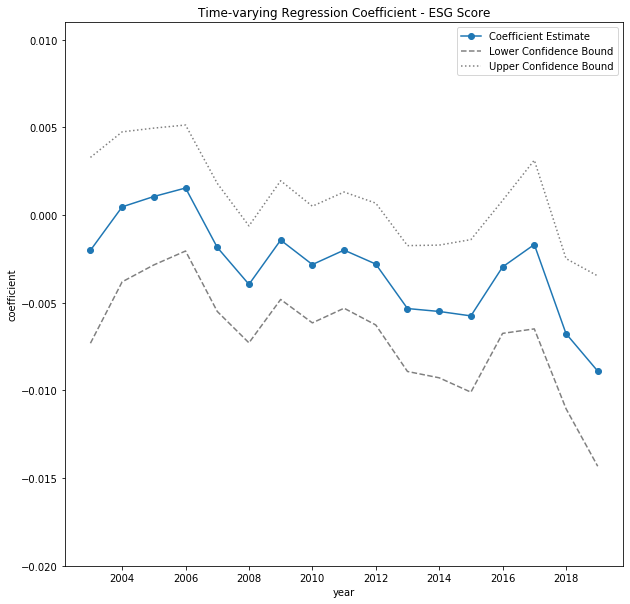

In [227]:
plot(res_esg, 'ESG Score')

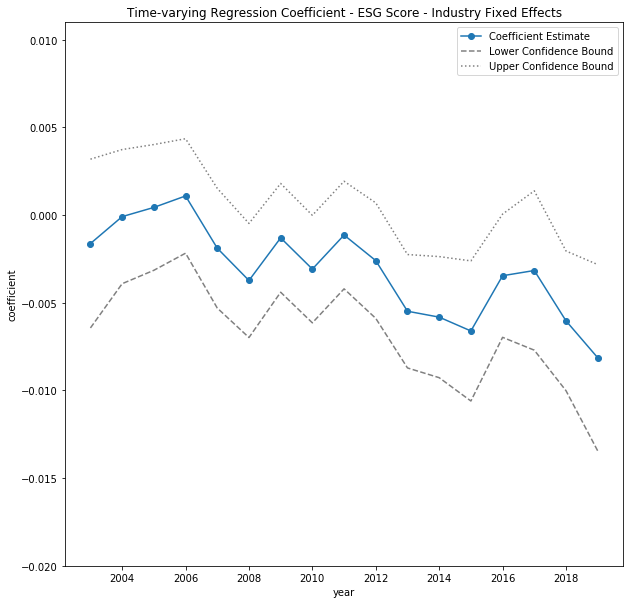

In [228]:
plot(res_esg_ind, 'ESG Score - Industry Fixed Effects')

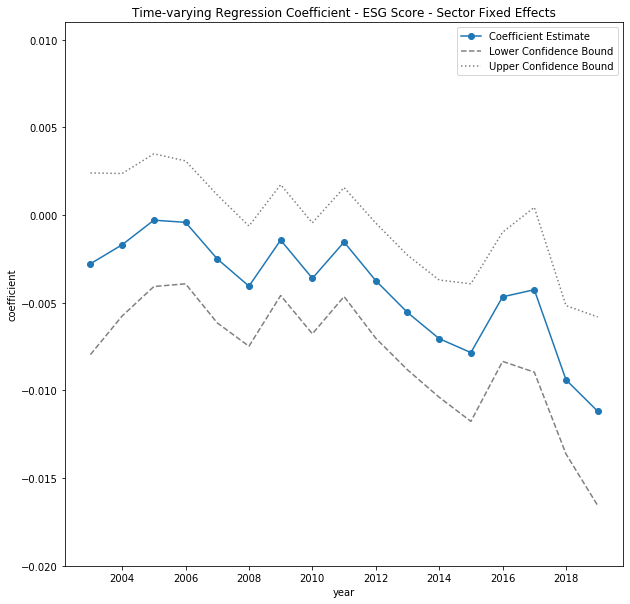

In [229]:
plot(res_esg_sec, 'ESG Score - Sector Fixed Effects')

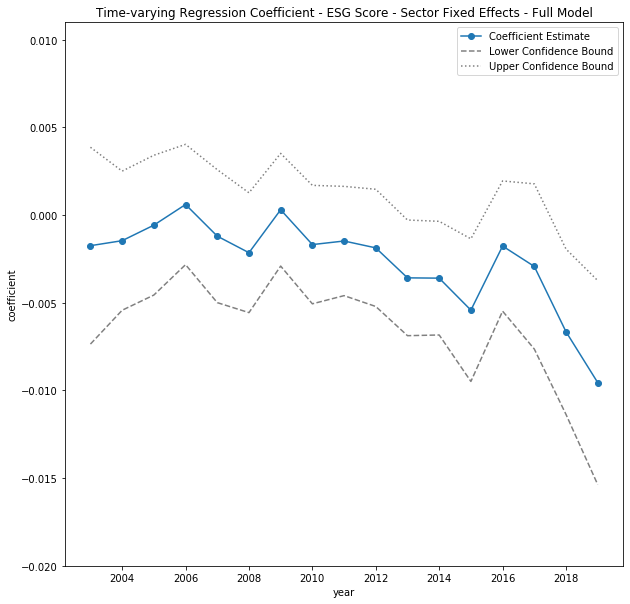

In [235]:
plot(res_both_add_esg, 'ESG Score - Sector Fixed Effects - Full Model')

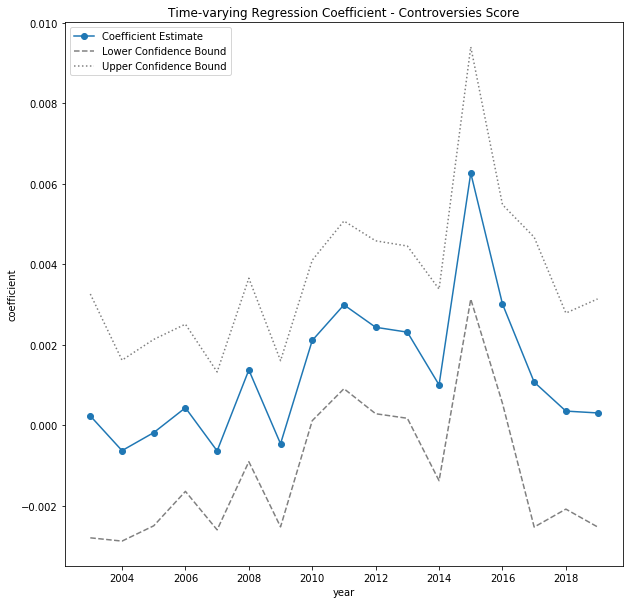

In [256]:
plot(res_cont, 'Controversies Score')

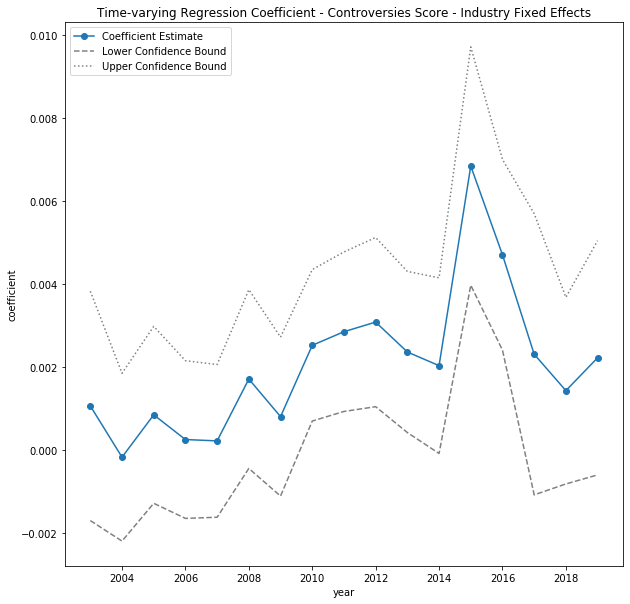

In [257]:
plot(res_cont_ind, 'Controversies Score - Industry Fixed Effects')

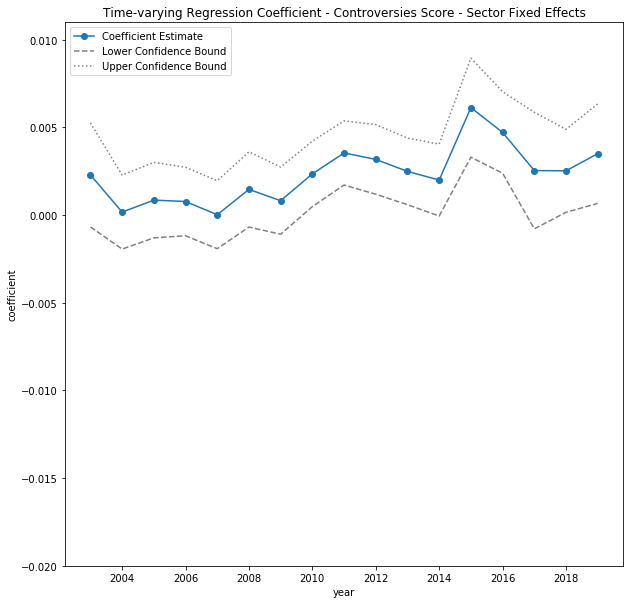

In [231]:
plot(res_cont_sec, 'Controversies Score - Sector Fixed Effects')

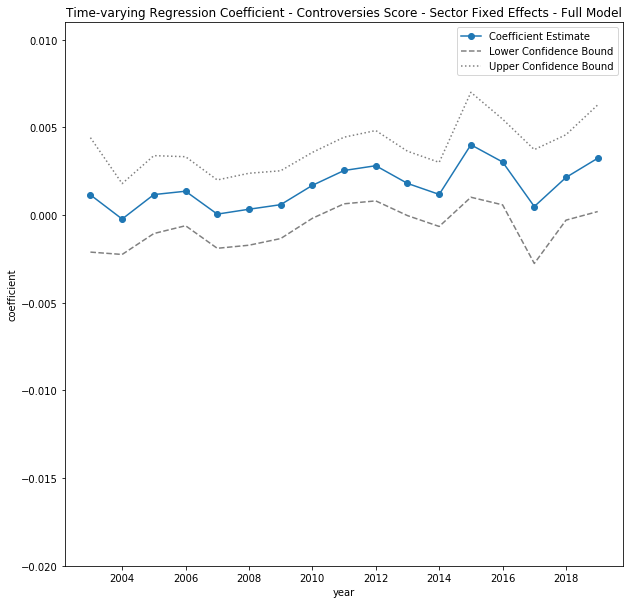

In [236]:
plot(res_both_add_cont, 'Controversies Score - Sector Fixed Effects - Full Model')

# Demean ESG Score and Controversies Score and look at interaction

In [266]:
data['ESG Score - dm'] = data['ESG Score'].sub(data['ESG Score'].mean())

In [268]:
data['Controversies Score - dm'] = data['Controversies Score'].sub(data['Controversies Score'].mean())

In [267]:
data[['ESG Score', 'ESG Score - dm']]

,ESG Score,ESG Score - dm
0,22.86,-26.484749
1,29.74,-19.604749
2,20.93,-28.414749
3,27.53,-21.814749
4,29.21,-20.134749
...,...,...
8390,NaN,NaN
8391,15.95,-33.394749
8392,23.26,-26.084749
8393,NaN,NaN


In [269]:
data['ESG*Controversies'] = data['ESG Score - dm']*data['Controversies Score - dm']

In [275]:
cont_vars0 = ['Controversies Score', 'ESG*Controversies', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage','CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [276]:
cont_vars = ['Controversies Score', 'ESG*Controversies', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage','CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [298]:
cont_vars2 = ['ESG Score','Controversies Score', 'Z-norm: Size', 'ROE', 'Net Sales Change Pct', 'Annual Return', 'Leverage', 'CapEx', 'Price-Earnings Ratio', 'Dividend Yield']

In [299]:
cont_vars.extend(ind)
cont_vars2.extend(sec)

In [300]:
mod_both = mod(data, cont_vars2, 'Price-to-Book').fit()

                            OLS Regression Results                            
Dep. Variable:          Price-to-Book   R-squared:                       0.510
Model:                            OLS   Adj. R-squared:                  0.505
Method:                 Least Squares   F-statistic:                     103.2
Date:                Wed, 10 Feb 2021   Prob (F-statistic):               0.00
Time:                        10:00:18   Log-Likelihood:                -3391.1
No. Observations:                5016   AIC:                             6884.
Df Residuals:                    4965   BIC:                             7217.
Df Model:                          50                                         
Covariance Type:            nonrobust                                         
                                                coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------

In [301]:
print(mod_both.summary().as_latex())

\begin{center}
\begin{tabular}{lclc}
\toprule
\textbf{Dep. Variable:}                            &  Price-to-Book   & \textbf{  R-squared:         } &     0.510   \\
\textbf{Model:}                                    &       OLS        & \textbf{  Adj. R-squared:    } &     0.505   \\
\textbf{Method:}                                   &  Least Squares   & \textbf{  F-statistic:       } &     103.2   \\
\textbf{Date:}                                     & Wed, 10 Feb 2021 & \textbf{  Prob (F-statistic):} &     0.00    \\
\textbf{Time:}                                     &     12:06:54     & \textbf{  Log-Likelihood:    } &   -3391.1   \\
\textbf{No. Observations:}                         &        5016      & \textbf{  AIC:               } &     6884.   \\
\textbf{Df Residuals:}                             &        4965      & \textbf{  BIC:               } &     7217.   \\
\textbf{Df Model:}                                 &          50      & \textbf{                     } &          